In [ ]:
%load_ext autoreload
%autoreload 2

In [1]:
# Essential Libraries
from s3_utils import * # Be sure this helper function file is in your workspace
import os
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import ast
import csv
import io
from io import StringIO, BytesIO, TextIOWrapper
import gzip
from datetime import datetime, date
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy

In [2]:
from datetime import timedelta
import pywt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import ks_2samp


In [3]:
from scipy.stats import ttest_ind

In [5]:
import sys
sys.path.append('../src')
from data_helpers import load_static_feat
import helper_function as hf

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
len(super_healthy_id)

28

In [7]:
file_loc = '/storage/data/bump/'
key = 'bump/redcap/birthing_data.csv.gz'
df_birth = pd.read_csv(file_loc+key, compression='gzip')
df_birth['date'] = pd.to_datetime(df_birth.birth_date).dt.date

In [10]:
key = 'bump/oura/oura_sleep.csv.gz'
df_sleep = pd.read_csv(file_loc+key, compression='gzip')
df_sleep['date'] = pd.to_datetime(df_sleep.event_date).dt.date

In [13]:
df_birth = df_birth.loc[df_birth['birth_date'].notna()]
birth_ids = (df_birth.record_id.unique())
birth_ids = np.sort(birth_ids)
sleep_ids = np.sort(df_sleep.record_id.unique())
sleep_ids_new = [b_id for b_id in list(sleep_ids) if b_id in list(birth_ids)]

In [15]:
df_birth.birth_mode.unique() #1: C-section, 2: Vaginal
df_birth.induction_yn.unique() #induced or not 

array([nan,  0.,  1.])

In [16]:
df_labor = df_birth.loc[:,['record_id','birth_mode','induction_yn']]
df_labor = df_labor.loc[df_labor.record_id.isin(sleep_ids_new)]
df_labor.drop_duplicates(subset='record_id', inplace=True)

In [17]:
df2_sleep = hf.findDaysSince(df_sleep, sleep_ids_new, df_birth)

In [19]:
len(df_birth.record_id.unique()), len(df_sleep.record_id.unique()), len(df2_sleep.record_id.unique())

(431, 536, 426)

In [15]:
static_feat = load_static_feat(file_loc, sleep_ids_new, df_birth, parity=True, pred_cond=False)

/storage/home/tinbeh/Bump_repo/data_helpers.py:16: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df_survey = pd.read_csv(file_loc+key, compression='gzip') #dtype={"user_id": int, "username": "string"}


In [16]:
static_feat2 = static_feat.merge(df_labor,how='left',on='record_id')
static_feat2.dropna(subset='birth_mode', inplace=True)
static_feat2.loc[static_feat2.induction_yn.isna(), 'induction_yn'] = 0
len(static_feat), len(static_feat2)

(400, 394)

In [17]:
static_feat2['EED_b1'] = (static_feat2.gestage_week < 40) & ((static_feat2.induction_yn == 1) | (static_feat2.birth_mode == 1))
static_feat2['EED_b2'] = (static_feat2.gestage_week < 40) & ~((static_feat2.induction_yn == 1) | (static_feat2.birth_mode == 1))
static_feat2['EED_a1'] = (static_feat2.gestage_week>=40) & (static_feat2.induction_yn==1)
static_feat2['EED_a2'] = (static_feat2.gestage_week>=40) & (static_feat2.induction_yn==0)

In [18]:
static_feat2['EED_g'] = 0
static_feat2.loc[static_feat2['EED_b2'], 'EED_g'] = 1
static_feat2.loc[static_feat2['EED_a1'], 'EED_g'] = 2
static_feat2.loc[static_feat2['EED_a2'], 'EED_g'] = 3

In [19]:
sum(static_feat2.loc[static_feat2['EED_b1'], 'gestage_week'] <30)

3

In [20]:
static_feat = static_feat2

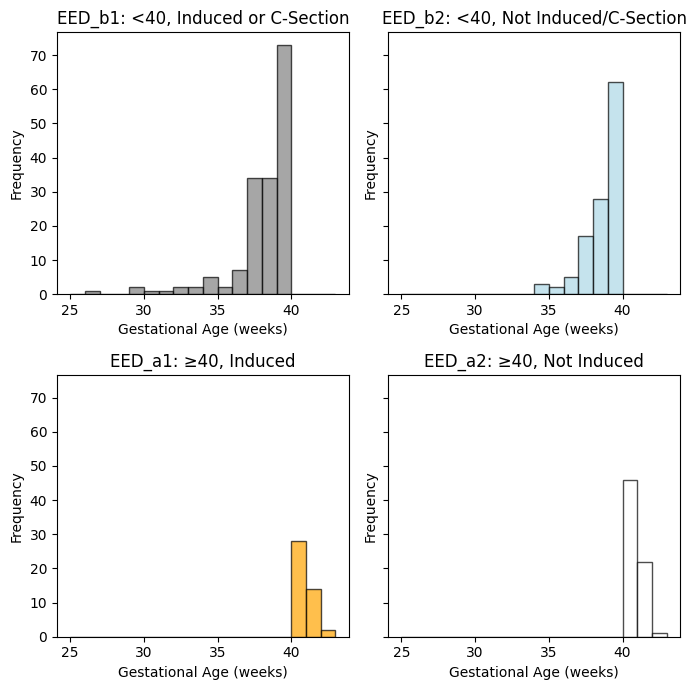

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(7, 7), sharey=True)

# Histogram for EED_b1
axs[0, 0].hist(static_feat2.loc[static_feat2['EED_b1'], 'gestage_week'], bins=range(25, 44), color='gray', alpha=0.7, edgecolor='black')
axs[0, 0].set_title('EED_b1: <40, Induced or C-Section')

# Histogram for EED_b2
axs[0, 1].hist(static_feat2.loc[static_feat2['EED_b2'], 'gestage_week'], bins=range(25, 44), color='lightblue', alpha=0.7, edgecolor='black')
axs[0, 1].set_title('EED_b2: <40, Not Induced/C-Section')

# Histogram for EED_a1
axs[1, 0].hist(static_feat2.loc[static_feat2['EED_a1'], 'gestage_week'], bins=range(25, 44), color='orange', alpha=0.7, edgecolor='black')
axs[1, 0].set_title('EED_a1: ≥40, Induced')

# Histogram for EED_a2
axs[1, 1].hist(static_feat2.loc[static_feat2['EED_a2'], 'gestage_week'], bins=range(25, 44), color='white', alpha=0.7, edgecolor='black')
axs[1, 1].set_title('EED_a2: ≥40, Not Induced')

# Set labels for each subplot
for ax in axs.flat:
    ax.set_xlabel('Gestational Age (weeks)')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [22]:
df_sleep

,id,user_id,identity_id,created_at,updated_at,retrieved_at,subsource,event_date,awake,bedtime_end,...,score_latency,score_rem,score_total,temperature_delta,temperature_deviation,temperature_trend_deviation,timezone,total,record_id,date
0,1966732,992,2269,2021-10-25 11:03:03.125937,2021-10-25 11:03:03.125937,2021-10-24 00:00:00,sleep,2021-10-25 00:00:00,2100.0,2021-10-25 06:54:38,...,83,51,85,0.00,0.00,-0.01,-240.0,27360.0,sema4_348,2021-10-25
1,1931630,992,2269,2021-10-23 14:03:07.112152,2021-10-23 14:03:07.112152,2021-10-22 00:00:00,sleep,2021-10-23 00:00:00,2580.0,2021-10-23 08:45:12,...,91,77,80,-0.21,-0.21,-0.02,-240.0,26340.0,sema4_348,2021-10-23
2,1912104,992,2269,2021-10-22 12:02:59.334327,2021-10-22 12:02:59.334327,2021-10-21 00:00:00,sleep,2021-10-22 00:00:00,1620.0,2021-10-22 07:04:20,...,70,49,88,-0.03,-0.03,0.03,-240.0,28320.0,sema4_348,2021-10-22
3,1900559,992,2269,2021-10-21 23:03:01.419843,2021-10-21 23:03:01.419843,2021-10-20 00:00:00,sleep,2021-10-21 00:00:00,2100.0,2021-10-21 07:01:02,...,75,71,80,-0.09,-0.09,0.01,-240.0,26340.0,sema4_348,2021-10-21
4,1888358,992,2269,2021-10-21 01:02:58.589422,2021-10-21 01:02:58.589422,2021-10-19 00:00:00,sleep,2021-10-20 00:00:00,2700.0,2021-10-20 06:44:30,...,70,39,78,0.05,0.05,NaN,-240.0,25860.0,sema4_348,2021-10-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78841,5992165,2006,6606,2022-04-01 10:03:10.300444,2022-04-01 10:03:10.300444,2022-03-31 00:00:00,sleep,2022-04-01 00:00:00,4740.0,2022-04-01 06:00:51,...,70,72,80,-0.03,-0.03,0.00,-240.0,26940.0,sema4_715,2022-04-01
78842,5970899,2006,6606,2022-03-31 10:03:07.23187,2022-03-31 10:03:07.23187,2022-03-30 00:00:00,sleep,2022-03-31 00:00:00,3930.0,2022-03-31 05:45:38,...,89,69,70,-0.08,-0.08,0.00,-240.0,24210.0,sema4_715,2022-03-31
78843,5947707,2006,6606,2022-03-30 10:03:12.718994,2022-03-30 10:03:12.718994,2022-03-29 00:00:00,sleep,2022-03-30 00:00:00,3060.0,2022-03-30 05:33:16,...,67,60,71,-0.14,-0.14,NaN,-240.0,24540.0,sema4_715,2022-03-30
78844,6552914,2060,7122,2022-04-21 17:03:25.068381,2022-04-21 17:03:25.068381,2022-04-18 00:00:00,sleep,2022-04-19 00:00:00,3090.0,2022-04-19 03:16:02,...,97,28,53,0.17,0.17,0.15,-240.0,19470.0,sema4_775,2022-04-19


In [23]:
sum(static_feat2['EED_b1']), sum(static_feat2['EED_b2']), sum(static_feat2['EED_a1']), sum(static_feat2['EED_a2'])

(164, 117, 44, 69)

In [24]:
len(static_feat.loc[static_feat.age<30]), len(static_feat.loc[static_feat.age>=30])

(40, 354)

In [25]:
len(static_feat.loc[static_feat.bmi<=25]), len(static_feat.loc[static_feat.bmi>25])

(212, 182)

In [26]:
sum(static_feat.gestage_week>=40), sum(static_feat.gestage_week<40)

(113, 281)

In [27]:
len(static_feat), len(sleep_ids_new)

(394, 426)

In [28]:
df_sleep.columns

Index(['id', 'user_id', 'identity_id', 'created_at', 'updated_at',
       'retrieved_at', 'subsource', 'event_date', 'awake', 'bedtime_end',
       'bedtime_end_delta', 'bedtime_start', 'bedtime_start_delta',
       'breath_average', 'deep', 'duration', 'efficiency', 'hr_5min',
       'hr_average', 'hr_lowest', 'hypnogram_5min', 'is_longest', 'light',
       'midpoint_at_delta', 'midpoint_time', 'onset_latency', 'period_id',
       'rem', 'restless', 'rmssd', 'rmssd_5min', 'score', 'score_alignment',
       'score_deep', 'score_disturbances', 'score_efficiency', 'score_latency',
       'score_rem', 'score_total', 'temperature_delta',
       'temperature_deviation', 'temperature_trend_deviation', 'timezone',
       'total', 'record_id', 'date'],
      dtype='object')

In [29]:
df_feat = df2_sleep.loc[:,['record_id','daysSince','deep','rem','light','total','awake', 'temperature_delta',
       'temperature_deviation', 'temperature_trend_deviation']].copy() #awake
##Convert seconds to hours estimates
df_feat.loc[:,['deep','rem','light','total','awake']] = df_feat.loc[:,['deep','rem','light','total','awake']] / 3600
df_feat.loc[:,['deep','rem','light','total','awake']] = df_feat.loc[:,['deep','rem','light','total','awake']].round(2)

In [30]:
##Merge static and dynamic features
df_w_static = df_feat.loc[df_feat.record_id.isin(static_feat.record_id.unique())].copy()
df_w_static = df_w_static.merge(static_feat, how='left', on='record_id')
#df_w_static.drop(columns = ['index_x'], inplace=True)
#df_w_static.reset_index(inplace=True)

In [31]:
##Time: GW at time of birth - day to birth
df_w_static['time'] = df_w_static['gestage_week'].add(df_w_static['daysSince']/7) 
df_w_static['time']  = df_w_static['time'].round(1)

In [32]:
df_w_static.loc[:,['daysSince', 'time', 'gestage_week']]

,daysSince,time,gestage_week
0,49.0,47.0,40.0
1,48.0,46.9,40.0
2,47.0,46.7,40.0
3,46.0,46.6,40.0
4,45.0,46.4,40.0
...,...,...,...
69571,-134.0,17.9,37.0
69572,-135.0,17.7,37.0
69573,-136.0,17.6,37.0
69574,-137.0,17.4,37.0


In [33]:
df_w_static = df_w_static.loc[df_w_static.daysSince<=0]

In [34]:
##10–19, 20–29, and 30–39 GW classes 
df_w_static['GW_class'] = 0
c1=df_w_static.time.ge(10)&df_w_static.time.le(19)
c2=df_w_static.time.gt(19)&df_w_static.time.le(29)
c3=df_w_static.time.gt(29)&df_w_static.time.le(39)
df_w_static.loc[c1,'GW_class'] = 1.0
df_w_static.loc[c2,'GW_class'] = 2.0
df_w_static.loc[c3,'GW_class'] = 3.0

In [35]:
df_w_static['bmi_c'] = 0
c1=df_w_static.bmi.gt(25)
df_w_static.loc[c1,'bmi_c'] = 1.0
df_w_static['bmi_c2'] = 0
c1=df_w_static.bmi.gt(28)
df_w_static.loc[c1,'bmi_c2'] = 1.0
df_w_static['age_c'] = 0
c1=df_w_static.age.ge(30)
df_w_static.loc[c1,'age_c'] = 1.0

In [36]:
len(df_w_static.loc[df_w_static.GW_class == 0]), len(df_w_static.loc[df_w_static.GW_class != 0])

(4089, 51349)

In [37]:
len(df_w_static.loc[df_w_static.GW_class == 1]), len(df_w_static.loc[df_w_static.GW_class == 2]), len(df_w_static.loc[df_w_static.GW_class == 3])

(11406, 21392, 18551)

In [38]:
df_w_static = df_w_static.loc[df_w_static.GW_class != 0]

In [39]:
unique_id = df_w_static.record_id.unique()
value_mapping = {cat: i for i, cat in zip(np.arange(len(unique_id)), sorted(unique_id))}
df_w_static['map_id'] = df_w_static['record_id'].map(value_mapping)

In [40]:
df_w_static

,record_id,daysSince,deep,rem,light,total,awake,temperature_delta,temperature_deviation,temperature_trend_deviation,...,EED_b2,EED_a1,EED_a2,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id
53,direct_10,-7.0,1.19,1.92,3.56,6.68,1.21,-0.09,-0.09,0.05,...,False,False,True,3,39.0,3,0,0,1,0
54,direct_10,-9.0,1.08,2.01,4.05,7.13,2.05,-0.03,-0.03,0.10,...,False,False,True,3,38.7,3,0,0,1,0
55,direct_10,-10.0,1.40,1.87,3.41,6.68,1.06,0.02,0.02,0.12,...,False,False,True,3,38.6,3,0,0,1,0
56,direct_10,-11.0,1.10,2.00,5.01,8.11,0.94,0.03,0.03,0.07,...,False,False,True,3,38.4,3,0,0,1,0
57,direct_10,-12.0,0.72,1.39,4.51,6.62,1.40,0.02,0.02,0.00,...,False,False,True,3,38.3,3,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69571,sema4_992,-134.0,2.75,1.15,2.88,6.78,0.63,-0.35,-0.35,-0.13,...,True,False,False,1,17.9,1,1,0,0,384
69572,sema4_992,-135.0,2.58,1.29,4.03,7.89,0.44,-0.07,-0.07,0.00,...,True,False,False,1,17.7,1,1,0,0,384
69573,sema4_992,-136.0,2.00,1.23,4.32,7.54,0.66,-0.02,-0.02,0.01,...,True,False,False,1,17.6,1,1,0,0,384
69574,sema4_992,-137.0,2.08,1.15,4.45,7.68,0.68,-0.05,-0.05,0.01,...,True,False,False,1,17.4,1,1,0,0,384


In [41]:
record_id_list = list(df_w_static.record_id.unique())

In [42]:
df_w_static.reset_index(drop=True, inplace=True)

In [43]:
df_w_static.dropna(subset='rem', inplace=True)
df_w_static.dropna(subset='bmi', inplace=True)
df_w_static.reset_index(drop=True, inplace=True)

In [44]:
display(df_w_static.describe())

,daysSince,deep,rem,light,total,awake,temperature_delta,temperature_deviation,temperature_trend_deviation,gestage_week,...,n_prev_baby,birth_mode,induction_yn,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id
count,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51255.000000,51255.000000,50912.000000,51343.000000,...,51343.000000,51343.000000,51343.00000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000,51343.000000
mean,-90.610249,1.374289,1.671475,4.341757,7.387544,1.287344,-0.055480,-0.055480,0.015191,38.622393,...,0.364996,1.696083,0.33023,1.085192,25.678143,2.139182,0.441287,0.257893,0.909335,190.505132
std,51.263783,0.700210,0.716248,1.049391,1.237036,0.769762,0.173375,0.173375,1.457590,1.824374,...,0.713100,0.459952,0.47030,1.104837,7.343490,0.751058,0.496546,0.437479,0.287135,109.765953
min,-217.000000,0.000000,0.000000,0.000000,0.000000,0.020000,-1.880000,-1.880000,-327.680000,26.000000,...,0.000000,1.000000,0.00000,0.000000,10.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,-132.000000,0.880000,1.180000,3.650000,6.680000,0.760000,-0.150000,-0.150000,-0.050000,38.000000,...,0.000000,1.000000,0.00000,0.000000,19.700000,2.000000,0.000000,0.000000,1.000000,99.000000
50%,-90.000000,1.360000,1.620000,4.330000,7.440000,1.100000,-0.050000,-0.050000,0.020000,39.000000,...,0.000000,2.000000,0.00000,1.000000,25.700000,2.000000,0.000000,0.000000,1.000000,186.000000
75%,-47.000000,1.850000,2.100000,5.020000,8.170000,1.600000,0.040000,0.040000,0.090000,40.000000,...,1.000000,2.000000,1.00000,2.000000,31.900000,3.000000,1.000000,1.000000,1.000000,284.000000
max,0.000000,6.110000,6.030000,9.220000,14.370000,9.400000,3.980000,3.980000,1.630000,42.000000,...,4.000000,2.000000,1.00000,3.000000,39.000000,3.000000,1.000000,1.000000,1.000000,384.000000


Text(0.5, 1.0, 'temperature_trend_deviation')

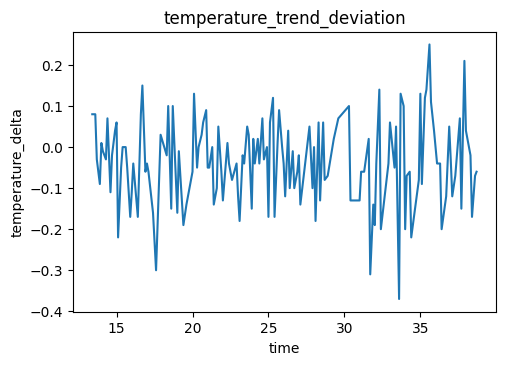

In [45]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.lineplot(x='time', y='temperature_delta', data=df_w_static.loc[df_w_static.record_id==record_id_list[3]])
plt.title('temperature_trend_deviation')

In [46]:
df_w_static['Gestational_week'] = df_w_static.time.round(0)

- Confidence Interval (CI): The CI is a statistical concept that represents the range within which we expect the true mean to lie with a certain level of confidence (usually 95%). The width of the CI depends on the sample size and the variability of the sample mean.
- Data Variance: This refers to the variability of the individual data points. It's the spread of all the data points around the mean, which can be much larger than the CI around the mean.

As the sample size increases, the CI generally becomes narrower because the estimate of the mean becomes more precise. 

                  estimated_value       std  count        ci
Gestational_week                                            
10.0                     1.449057  0.740541    297  0.084222
11.0                     1.392712  0.692809    553  0.057744
12.0                     1.429833  0.697222    657  0.053314
13.0                     1.395195  0.672557    768  0.047567
14.0                     1.425618  0.669396   1027  0.040941
15.0                     1.456116  0.659540   1331  0.035433
16.0                     1.514598  0.711069   1594  0.034908
17.0                     1.513784  0.694582   1855  0.031609
18.0                     1.474323  0.687893   2075  0.029598
19.0                     1.467289  0.681577   2191  0.028540
20.0                     1.489954  0.692558   2159  0.029214
21.0                     1.438803  0.697195   2147  0.029491
22.0                     1.441853  0.707595   2196  0.029595
23.0                     1.420302  0.704647   2182  0.029567
24.0                    

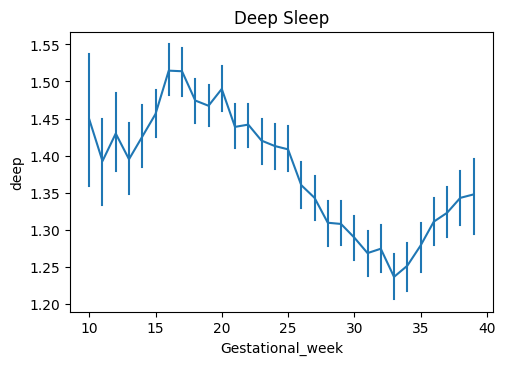

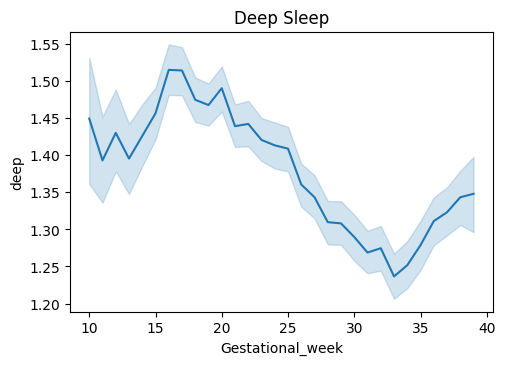

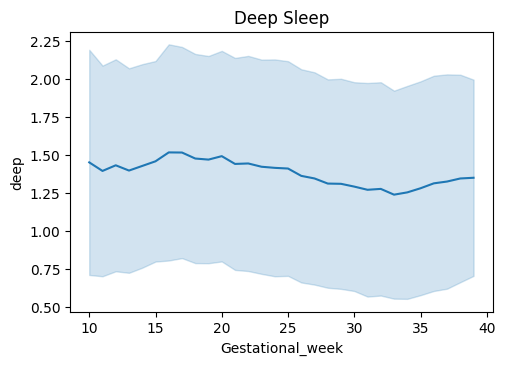

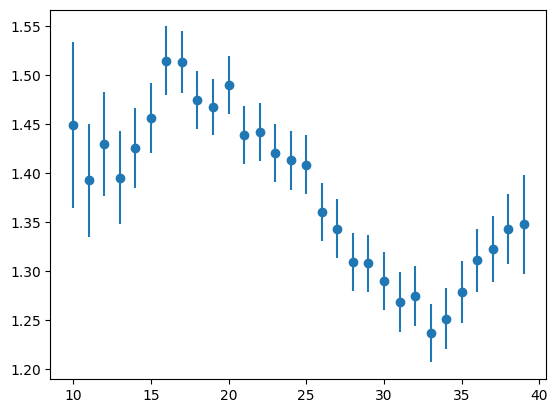

"\nplt.subplot(2, 2, 2)\nsns.lineplot(x='gestage_week', y='rem', data=df_w_static)\nplt.title('REM Sleep')\n\nplt.subplot(2, 2, 3)\nsns.lineplot(x='gestage_week', y='light', data=df_w_static)\nplt.title('Light Sleep')\n\nplt.subplot(2, 2, 4)\nsns.lineplot(x='gestage_week', y='total', data=df_w_static)\nplt.title('Total Sleep')\n\nplt.tight_layout()\nplt.show()\n"

In [47]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, err_style="bars")
plt.title('Deep Sleep')

plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static)
plt.title('Deep Sleep')

plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, errorbar="sd")
plt.title('Deep Sleep')

agg_data = df_w_static.groupby('Gestational_week')['deep'].agg(['mean', 'std', 'count'])
agg_data['ci'] = 1.96 * agg_data['std'] / np.sqrt(agg_data['count'])  # 95% CI

# Estimated data value is simply the mean
agg_data = agg_data.rename(columns={'mean': 'estimated_value'})

# Show the aggregated data
print(agg_data)

# Plot for comparison
plt.figure()
plt.errorbar(agg_data.index, agg_data['estimated_value'], yerr=agg_data['ci'], fmt='o', label='Estimated values with CI')
plt.show()
"""
plt.subplot(2, 2, 2)
sns.lineplot(x='gestage_week', y='rem', data=df_w_static)
plt.title('REM Sleep')

plt.subplot(2, 2, 3)
sns.lineplot(x='gestage_week', y='light', data=df_w_static)
plt.title('Light Sleep')

plt.subplot(2, 2, 4)
sns.lineplot(x='gestage_week', y='total', data=df_w_static)
plt.title('Total Sleep')

plt.tight_layout()
plt.show()
"""

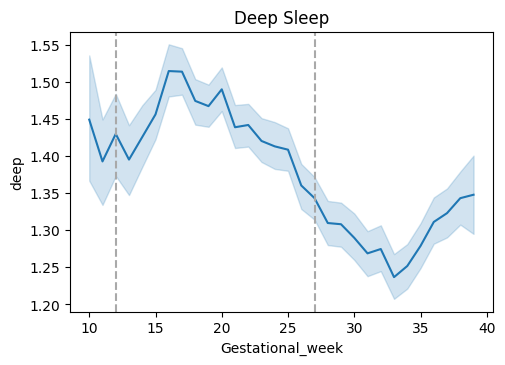

In [48]:
plt.figure(figsize=(12, 8))

# Deep Sleep subplot
plt.subplot(2, 2, 1)
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static)

# Add vertical lines to indicate transition between GW_class
plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')

# Add title and legend
plt.title('Deep Sleep')

# Show the plot
plt.show()

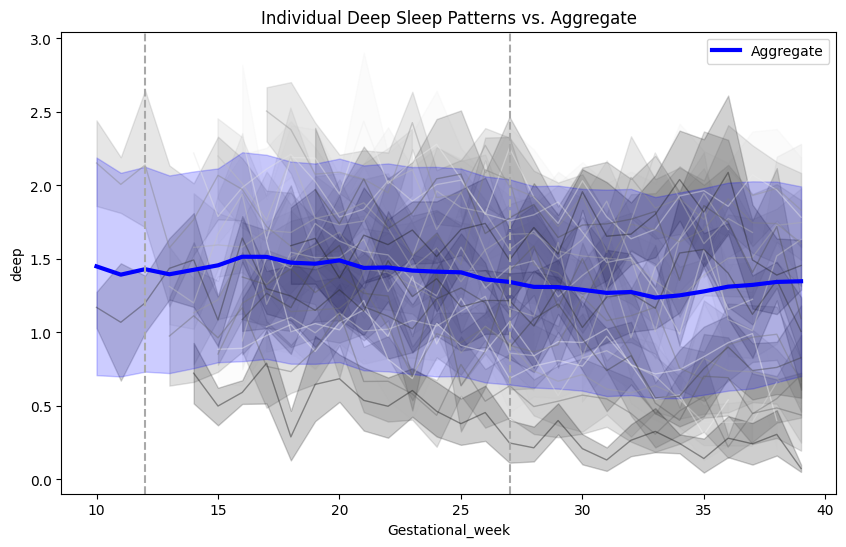

In [50]:
plt.figure(figsize=(10, 6))

# Plot individual patterns
df_subset = df_w_static[df_w_static['record_id'].isin(df_w_static['record_id'].unique()[150:170])]

sns.lineplot(x='Gestational_week', y='deep', hue='record_id', data=df_subset,
             palette='Greys', linewidth=1, alpha=0.4, legend=None)

# Plot aggregate (mean) pattern on top of the individuals
#sns.lineplot(x='Gestational_week', y='deep', data=df_w_static.groupby('Gestational_week', as_index=False).mean(),
#             color='black', linewidth=3, label='Aggregate')
sns.lineplot(x='Gestational_week', y='deep', color='blue', data=df_w_static, linewidth=3, label='Aggregate', errorbar="sd")

# Add vertical lines to indicate transition between GW_class
plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')
# Add title and legend
plt.title('Individual Deep Sleep Patterns vs. Aggregate')
plt.legend()

# Show the plot
plt.show()

/tmp/ipykernel_2762/4088400221.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Feature', y='Value', data=df[df['Model'] == 'Individuals'], palette=['lightblue', 'lightgreen'], inner='box')


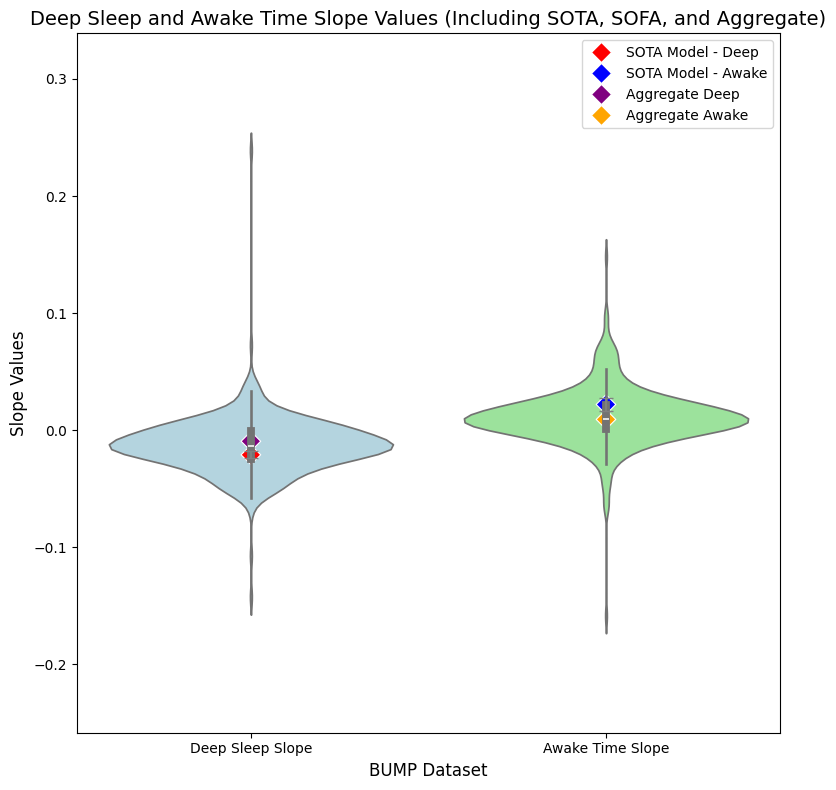

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress

# Assuming df_w_static has columns 'Gestational_week', 'deep', 'awake', and 'record_id'

def calculate_slopes(df, y_col):
    slopes = []
    for record_id in df['record_id'].unique():
        individual_data = df[df['record_id'] == record_id]
        # Perform linear regression on 'Gestational_week' vs the specified column (deep or awake)
        slope, _, _, _, _ = linregress(individual_data['Gestational_week'], individual_data[y_col])
        slopes.append(slope)
    return slopes

# Calculate slopes for deep sleep and awake time
deep_slopes = calculate_slopes(df_w_static, 'deep')
awake_slopes = calculate_slopes(df_w_static, 'awake')

# Calculate aggregate slope for deep sleep and awake time across the whole dataset
aggregate_deep_slope, _, _, _, _ = linregress(df_w_static['Gestational_week'], df_w_static['deep'])
aggregate_awake_slope, _, _, _, _ = linregress(df_w_static['Gestational_week'], df_w_static['awake'])

# Add the SOTA and SOFA models' slope values to the data
# SOTA model: -1.26 ± 0.18 for deep sleep
# SOFA model: 1.32 ± 0.34 for awake time
sota_deep_slope = -1.26 / 60  # Weekly slope
deep_slope_sd = 0.18 / 60     # Weekly SD
sofa_awake_slope = 1.32 / 60  # Weekly slope
awake_slope_sd = 0.34 / 60     # Weekly SD

# Create a DataFrame to hold the slopes and feature names
data = {
    'Feature': ['Deep Sleep Slope'] * len(deep_slopes) + ['Awake Time Slope'] * len(awake_slopes) +
               ['Deep Sleep SOTA', 'Awake Time SOFA', 'Deep Sleep Aggregate', 'Awake Time Aggregate'],
    'Value': deep_slopes + awake_slopes + [sota_deep_slope, sofa_awake_slope, aggregate_deep_slope, aggregate_awake_slope],
    'Model': ['Individuals'] * (len(deep_slopes) + len(awake_slopes)) + 
             ['SOTA Model - Deep', 'SOTA Model - Awake', 'Aggregate Deep', 'Aggregate Awake']  # Mark the models
}

df = pd.DataFrame(data)

# Create the violin plot
plt.figure(figsize=(8, 8))
sns.violinplot(x='Feature', y='Value', data=df[df['Model'] == 'Individuals'], palette=['lightblue', 'lightgreen'], inner='box')

# Overlay the SOTA, SOFA model slopes, and aggregate slopes with error bars
sns.scatterplot(x=['Deep Sleep Slope', 'Awake Time Slope', 'Deep Sleep Slope', 'Awake Time Slope'], 
                y=[sota_deep_slope, sofa_awake_slope, aggregate_deep_slope, aggregate_awake_slope], 
                hue=['SOTA Model - Deep', 'SOTA Model - Awake', 'Aggregate Deep', 'Aggregate Awake'], 
                palette=['red', 'blue', 'purple', 'orange'], s=100, marker='D')

# Add error bars for SOTA and SOFA
plt.errorbar(x=['Deep Sleep Slope', 'Awake Time Slope'], 
             y=[sota_deep_slope, sofa_awake_slope], 
             yerr=[deep_slope_sd, awake_slope_sd], fmt='none', c='gray', capsize=5, label='SOTA/ SOFA SD')

# Customize the plot
plt.title("Deep Sleep and Awake Time Slope Values (Including SOTA, SOFA, and Aggregate)", fontsize=14)
plt.xlabel("BUMP Dataset", fontsize=12)
plt.ylabel("Slope Values", fontsize=12)

# Dynamically set limits based on min and max slopes, including SOTA/SOFA and aggregate
plt.ylim(min(deep_slopes + awake_slopes + [sota_deep_slope, sofa_awake_slope, aggregate_deep_slope, aggregate_awake_slope]) - 0.1, 
         max(deep_slopes + awake_slopes + [sota_deep_slope, sofa_awake_slope, aggregate_deep_slope, aggregate_awake_slope]) + 0.1)

# Show the plot with a tight layout
plt.tight_layout()
plt.show()


In [52]:
df.to_csv('slopes.csv', index=False)

Text(0.5, 1.0, 'Deep Sleep')

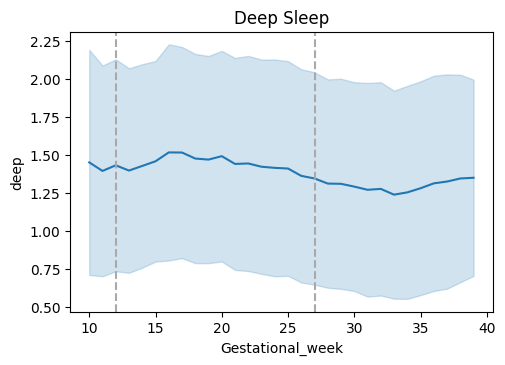

In [53]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, errorbar="sd")
# Add vertical lines to indicate transition between GW_class
plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')

plt.title('Deep Sleep')

In [54]:
df_w_static.head()

,record_id,daysSince,deep,rem,light,total,awake,temperature_delta,temperature_deviation,temperature_trend_deviation,...,EED_a1,EED_a2,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id,Gestational_week
0,direct_10,-7.0,1.19,1.92,3.56,6.68,1.21,-0.09,-0.09,0.05,...,False,True,3,39.0,3,0,0,1,0,39.0
1,direct_10,-9.0,1.08,2.01,4.05,7.13,2.05,-0.03,-0.03,0.10,...,False,True,3,38.7,3,0,0,1,0,39.0
2,direct_10,-10.0,1.40,1.87,3.41,6.68,1.06,0.02,0.02,0.12,...,False,True,3,38.6,3,0,0,1,0,39.0
3,direct_10,-11.0,1.10,2.00,5.01,8.11,0.94,0.03,0.03,0.07,...,False,True,3,38.4,3,0,0,1,0,38.0
4,direct_10,-12.0,0.72,1.39,4.51,6.62,1.40,0.02,0.02,0.00,...,False,True,3,38.3,3,0,0,1,0,38.0


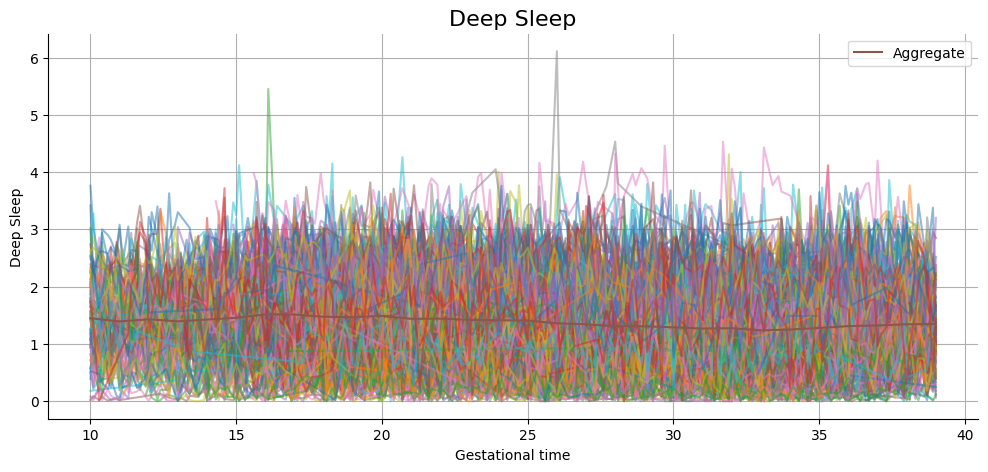

In [55]:
plt.figure(figsize=(12, 5))

# Plot all lines (spaghetti plot)
for ids in df_w_static.record_id.unique():
    subset = df_w_static.loc[df_w_static.record_id == ids]
    subset = subset.sort_values(by='time')
    plt.plot(subset['time'], subset['deep'], alpha=0.5)

# Plot the mean line
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, label='Aggregate')

# Labels and title
plt.title('Deep Sleep', fontsize=16)
plt.xlabel('Gestational time')
plt.ylabel('Deep Sleep')
plt.legend()

# Show the plot
plt.grid(True)
sns.despine()
plt.show()

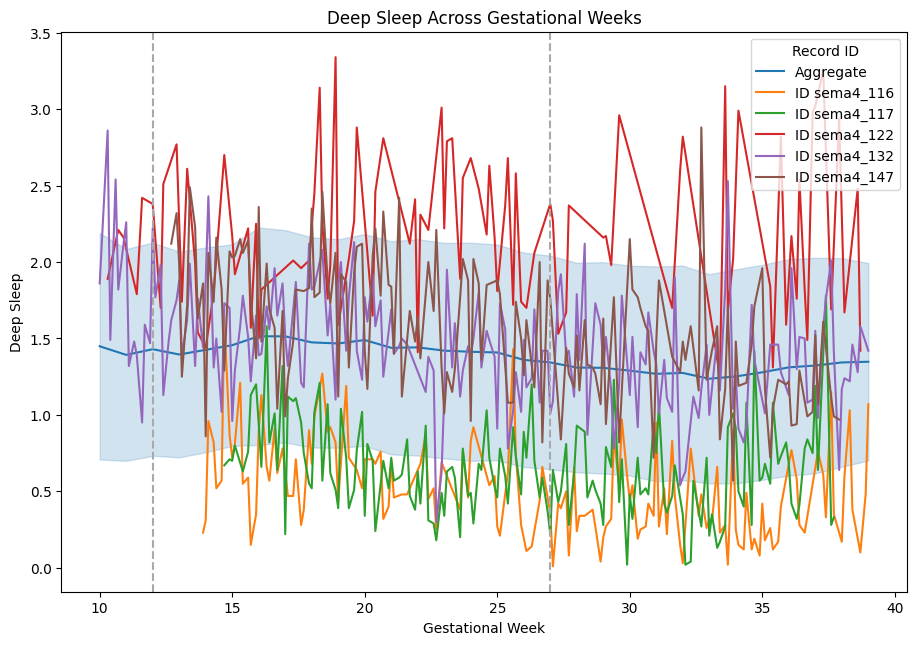

In [56]:
plt.figure(figsize=(24, 16))
plt.subplot(2, 2, 1)

# Main line plot using seaborn for the overall trends
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, label='Aggregate', errorbar="sd")

# Loop through each healthy ID and plot on the same subplot
for healthyid in super_healthy_id[5:10]:
    subset = df_w_static.loc[df_w_static.record_id == healthyid]
    subset = subset.sort_values(by='time')
    plt.plot(subset['time'], subset['deep'], label=f'ID {healthyid}')
# Add vertical lines to indicate transition between GW_class
plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')
plt.title('Deep Sleep Across Gestational Weeks')
plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep')
plt.legend(title='Record ID')  # Add legend with title
plt.show()

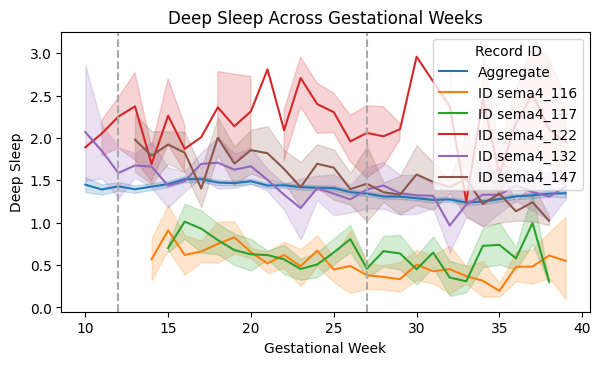

In [57]:
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)

# Main line plot using seaborn for the overall trends
sns.lineplot(x='Gestational_week', y='deep', data=df_w_static, label='Aggregate')

# Loop through each healthy ID and plot on the same subplot
for healthyid in super_healthy_id[5:10]:
    subset = df_w_static.loc[df_w_static.record_id == healthyid]
    subset = subset.sort_values(by='Gestational_week')
    sns.lineplot(x='Gestational_week', y='deep', data=subset, label=f'ID {healthyid}')

# Add vertical lines to indicate transition between GW_class
plt.axvline(x=12, color='darkgray', linestyle='--')
plt.axvline(x=27, color='darkgray', linestyle='--')
plt.title('Deep Sleep Across Gestational Weeks')
plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep')
plt.legend(title='Record ID')  # Add legend with title
plt.show()

In [58]:
subset.loc[:,['daysSince','deep','time','Gestational_week']]

,daysSince,deep,time,Gestational_week
17915,-177.0,2.12,12.7,13.0
17912,-174.0,1.25,13.1,13.0
17913,-175.0,1.98,13.0,13.0
17910,-172.0,2.49,13.4,13.0
17911,-173.0,1.72,13.3,13.0
...,...,...,...,...
17763,-7.0,1.52,37.0,37.0
17761,-5.0,1.61,37.3,37.0
17760,-3.0,1.11,37.6,38.0
17759,-2.0,0.99,37.7,38.0


In [59]:
df_w_static.loc[df_w_static.record_id==healthyid].time

17758    37.9
17759    37.7
17760    37.6
17761    37.3
17762    37.1
         ... 
17911    13.3
17912    13.1
17913    13.0
17914    12.9
17915    12.7
Name: time, Length: 158, dtype: float64

Text(0, 0.5, 'deep sleep')

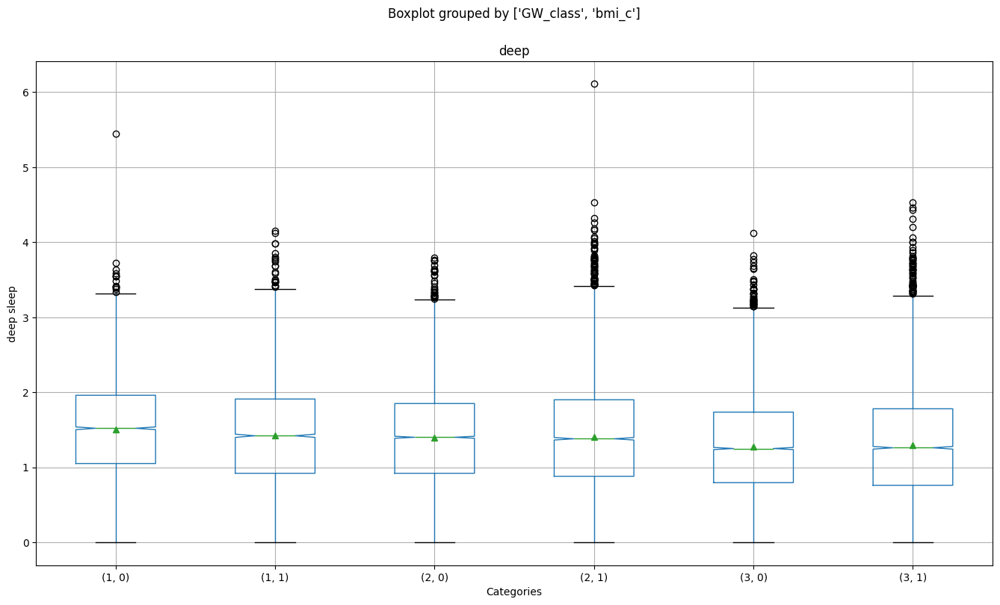

In [60]:
boxplot = df_w_static.boxplot(["deep"], by = ["GW_class","bmi_c"],
                     figsize = (16, 9),
                     showmeans = True,
                     notch = True)

boxplot.set_xlabel("Categories")
boxplot.set_ylabel("deep sleep")

#boxplot.figure.savefig("...\\boxplot.png")

In [61]:
#bins = [10, 19, 29, 39]
#labels = ['10-19 weeks', '20-29 weeks', '30-39 weeks']
#df_w_static['Period'] = pd.cut(df_w_static['time'], bins=bins, labels=labels, right=True)

# Calculate mean and SD for each sleep parameter within each period
summary_stats = df_w_static.loc[:,['deep','rem','light','total','awake','GW_class']].groupby('GW_class').agg(['mean', 'std'])

In [62]:
summary_stats

deep                 rem               light            \
              mean       std      mean       std      mean       std   
GW_class                                                               
1         1.466557  0.688982  1.549069  0.669774  4.605314  1.077156   
2         1.400238  0.700686  1.659309  0.707013  4.376442  1.042377   
3         1.287649  0.696885  1.760754  0.741935  4.139736  0.998521   

             total               awake            
              mean       std      mean       std  
GW_class                                          
1         7.620956  1.224018  1.237377  0.749160  
2         7.436026  1.217317  1.230643  0.736476  
3         7.188151  1.236913  1.383434  0.809422

In [63]:
results = {}
summaries = {}
sleep_stages = ['deep', 'rem', 'light', 'total']
for sleep_stage in sleep_stages:
    model = smf.mixedlm(f"{sleep_stage} ~ GW_class", df_w_static, groups=df_w_static['map_id']) #Gestational_week
    mdf = model.fit()
    p_value = mdf.pvalues['GW_class']
    results[sleep_stage] = p_value
    summaries[sleep_stage] = mdf.summary()

for stage, summary in summaries.items():
    print(f"Results for {stage}:")
    print(summary.tables[1])
# Creating the output table
table1 = pd.DataFrame({
    'Sleep Stage': sleep_stages,
    'p-value': [results[stage] for stage in sleep_stages]
})

print(table1)

Results for deep:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   1.626    0.029   56.499  0.000   1.569   1.682
GW_class   -0.118    0.003  -44.770  0.000  -0.123  -0.113
Group Var   0.305    0.051                                
Results for rem:
           Coef. Std.Err.       z  P>|z| [0.025 0.975]
Intercept  1.425    0.027  53.724  0.000  1.373  1.477
GW_class   0.110    0.003  35.891  0.000  0.104  0.116
Group Var  0.252    0.037                             
Results for light:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   4.794    0.034  139.564  0.000   4.726   4.861
GW_class   -0.221    0.005  -44.215  0.000  -0.231  -0.211
Group Var   0.404    0.036                                
Results for total:
            Coef. Std.Err.        z  P>|z|  [0.025  0.975]
Intercept   7.844    0.036  216.227  0.000   7.773   7.915
GW_class   -0.229    0.006  -35.784  0.000  -0.241  -0.216
Group Var   0.425    0.030                                

In [64]:
# Formula for MMRM
# "outcome ~ time + covariate1 + covariate2" specifies the fixed effects
# "1|id" specifies a random intercept for each subject
formula = 'deep ~ time + bmi + age' #time*bmi, time*age
#formula = 'temperature_delta ~ GW_class'
# Fit the mixed model
model = smf.mixedlm(formula, df_w_static, groups=df_w_static['map_id'])
result = model.fit()

# Print the summary
print(result.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: deep       
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.1859     
Min. group size:  5       Log-Likelihood:     -30693.2221
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
---------------------------------------------------------
              Coef.  Std.Err.    z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept      1.955    0.220   8.870 0.000  1.523  2.387
time          -0.013    0.000 -46.746 0.000 -0.013 -0.012
bmi            0.006    0.005   1.183 0.237 -0.004  0.016
age           -0.012    0.005  -2.387 0.017 -0.021 -0.002
Group Var      0.301    0.051                            



In [80]:
#"""
model_formula = 'deep ~ age_c + bmi + time + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'
#model_formula = 'deep ~ age + bmi + time + GW_class:bmi + bmi_c:age + GW_class:age'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit(reml=False)

# Print the results
print(mixedlm_result.summary())
#"""
var_components = mixedlm_result.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: deep       
No. Observations:  51343   Method:             ML         
No. Groups:        385     Scale:              0.1858     
Min. group size:   5       Log-Likelihood:     -30668.4722
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       1.474    0.217   6.802 0.000  1.050  1.899
age_c          -0.111    0.107  -1.040 0.298 -0.320  0.098
bmi             0.014    0.007   1.930 0.054 -0.000  0.028
time           -0.012    0.001 -19.812 0.000 -0.013 -0.010
GW_class:bmi_c -0.016    0.005  -3.219 0.001 -0.026 -0.006
bmi_c:age_c    -0.096    0.088  -1.092 0.275 -0.268  0.076
GW_class:age_c -0.004    0.006  -0.707 0.480 -0.016  0.008
Group Va

In [81]:
reduced_formula = 'deep ~ bmi  + time + GW_class:bmi_c'

reduced_model = smf.mixedlm(reduced_formula, df_w_static, groups=df_w_static['map_id'])
reduced_result = reduced_model.fit(reml=False)

In [82]:
ll_full = mixedlm_result.llf  # log-likelihood of the full model
ll_reduced = reduced_result.llf  # log-likelihood of the reduced model

# Calculate the likelihood ratio statistic
lr_stat = -2 * (ll_reduced - ll_full)

# Degrees of freedom: difference in the number of parameters between models
df_diff = mixedlm_result.df_modelwc - reduced_result.df_modelwc

# p-value from chi-square distribution
p_value = stats.chi2.sf(lr_stat, df_diff)
#If the p-value is below a chosen significance level (e.g., 0.05), it suggests that the interactions involving age_c significantly improve the model fit.
print(f"Likelihood ratio statistic: {lr_stat}, p-value: {p_value}")

Likelihood ratio statistic: 4.980278698028997, p-value: 0.1732469439033919


In [68]:
aic_full = mixedlm_result.aic
aic_reduced = reduced_result.aic
print(f"AIC Full: {aic_full}, AIC Reduced: {aic_reduced}, {(aic_full-aic_reduced)/aic_full}")

AIC Full: 61352.44658721937, AIC Reduced: 61353.92458564392, -2.4090293163013533e-05


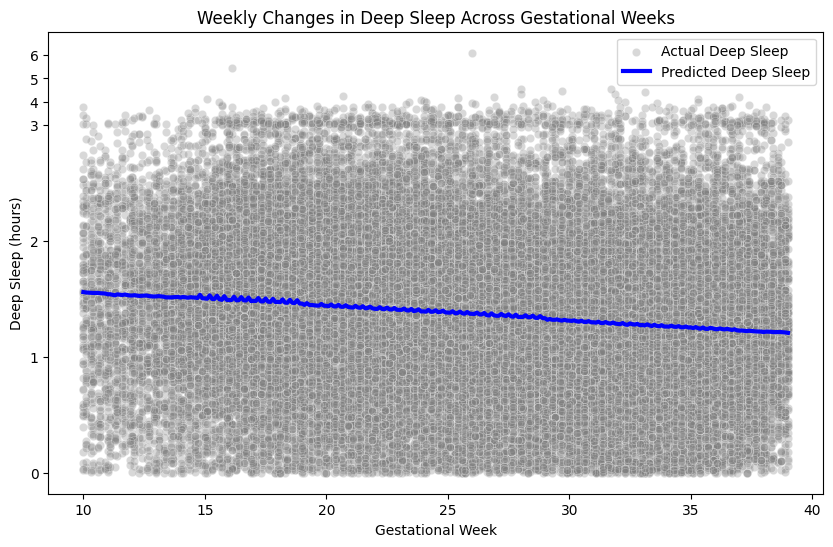

In [108]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

def stretch_y(y, a_stretch=5):
    if y <= 3:
        return y * a_stretch  # Stretch values in the range [0, 3]
    else:
        return 3*a_stretch + (y - 3)  # Keep values above 3 in linear scale but shift them

# Plotting
df_w_static['deep_stretched'] = df_w_static['deep'].apply(stretch_y)
df_w_static['PredictedDeepSleep_stretched'] = df_w_static['PredictedDeepSleep'].apply(stretch_y)

plt.figure(figsize=(10, 6))

sns.scatterplot(x='time', y='deep_stretched', data=df_w_static, color='gray', alpha=0.3, label='Actual Deep Sleep')  # Reduced alpha for more fading

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static, color='blue', label='Predicted Deep Sleep', errorbar=None, linewidth=3)

# Customize y-ticks to reflect the natural range better
plt.yticks([stretch_y(y) for y in range(0, 7)], range(0, 7))


plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

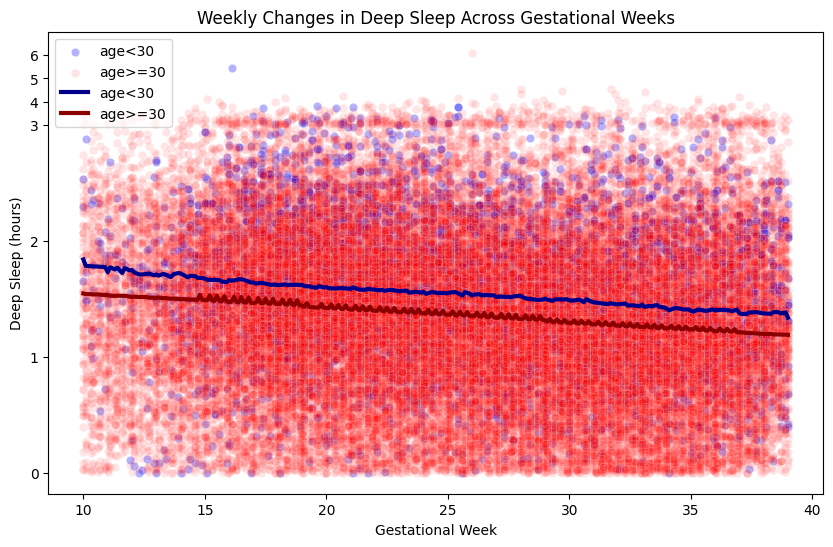

In [109]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='time', y='deep_stretched', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.3, label='age<30')
sns.scatterplot(x='time', y='deep_stretched', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.1, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c==0], color='darkblue', label='age<30', errorbar=None, linewidth=3)
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c==1], color='darkred', label='age>=30', errorbar=None, linewidth=3)
plt.yticks([stretch_y(y) for y in range(0, 7)], range(0, 7))
plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

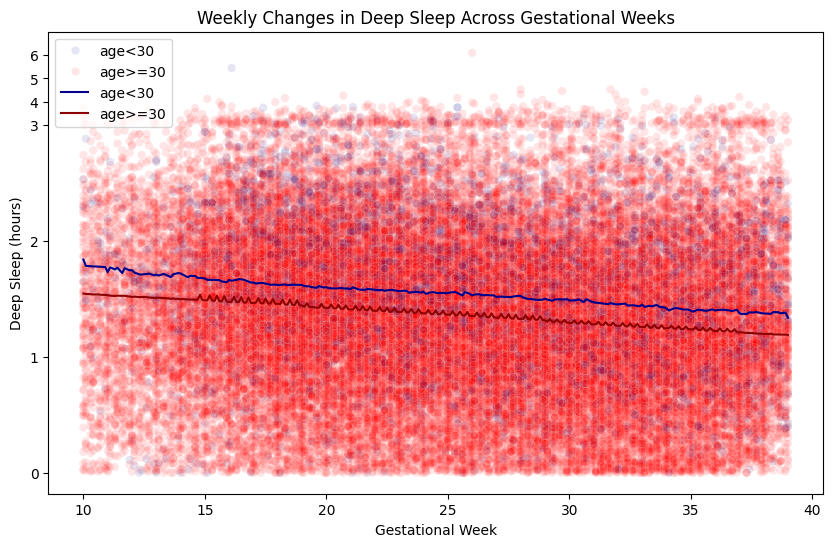

In [110]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='time', y='deep_stretched', data=df_w_static, color='blue', alpha=0.1, hue='age_c', palette={0: 'darkblue', 1: 'red'}, hue_order=[0, 1])

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c==0], color='darkblue', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c==1], color='darkred', label='age>=30', errorbar=None)
handles, labels = plt.gca().get_legend_handles_labels()
# Display only 4 of the 5 legends (for example, skipping the first one)
plt.legend(handles[:], [ 'age<30', 'age>=30', 'age<30', 'age>=30'])

plt.yticks([stretch_y(y) for y in range(0, 7)], range(0, 7))
plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')

plt.show()

In [153]:
df_w_static.columns

Index(['record_id', 'daysSince', 'deep', 'rem', 'light', 'total', 'awake',
       'temperature_delta', 'temperature_deviation',
       'temperature_trend_deviation', 'gestage_week', 'age', 'weight_pre',
       'bmi', 'n_prev_baby', 'birth_mode', 'induction_yn', 'EED_b1', 'EED_b2',
       'EED_a1', 'EED_a2', 'EED_g', 'time', 'GW_class', 'bmi_c', 'bmi_c2',
       'age_c', 'map_id', 'Gestational_week', 'PredictedDeepSleep',
       'deep_stretched', 'PredictedDeepSleep_stretched', 'PredictedRemSleep',
       'rem_stretched', 'PredictedRemSleep_stretched'],
      dtype='object')

In [69]:
model_formula = 'rem ~ age + bmi + time+ GW_class:bmi_c2 + bmi_c2:age_c + GW_class:age_c'# + time:bmi'
#model_formula = 'rem ~ age + bmi + time + GW_class:bmi + bmi:age + GW_class:age'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result_rem = mixedlm_model.fit(reml=False)

# Print the results
print(mixedlm_result.summary())
var_components = mixedlm_result_rem.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result_rem.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: deep       
No. Observations:  51343   Method:             ML         
No. Groups:        385     Scale:              0.1858     
Min. group size:   5       Log-Likelihood:     -30667.2233
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       1.723    0.264   6.523 0.000  1.205  2.241
age            -0.010    0.005  -1.896 0.058 -0.020  0.000
bmi             0.014    0.007   1.952 0.051 -0.000  0.027
time           -0.012    0.001 -19.870 0.000 -0.013 -0.010
GW_class:bmi_c -0.017    0.005  -3.239 0.001 -0.027 -0.007
bmi_c:age_c    -0.089    0.082  -1.089 0.276 -0.250  0.071
GW_class:age_c -0.004    0.006  -0.696 0.486 -0.016  0.008
Group Va

In [70]:
df_w_static['PredictedRemSleep'] = mixedlm_result_rem.predict(df_w_static)
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

df_w_static['rem_stretched'] = df_w_static['rem'].apply(stretch_y)
df_w_static['PredictedRemSleep_stretched'] = df_w_static['PredictedRemSleep'].apply(stretch_y)


# Plotting
indices = (df_w_static.bmi_c==1)&(df_w_static.age_c==1)

plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='rem_stretched', data=df_w_static[indices], color='blue', alpha=0.1, label='other')
sns.scatterplot(x='time', y='rem_stretched', data=df_w_static[~indices], color='red', alpha=0.1, label='BMI>25 & age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedRemSleep_stretched', data=df_w_static[indices], color='darkblue', label='other', errorbar=None, linewidth=3)
sns.lineplot(x='time', y='PredictedRemSleep_stretched', data=df_w_static[~indices], color='darkred', label='BMI>25 & age>=30', errorbar=None, linewidth=3)
plt.yticks([stretch_y(y) for y in range(0, 7)], range(0, 7))

plt.xlabel('Gestational Week')
plt.ylabel('Rem Sleep (hours)')
plt.title('Weekly Changes in Rem Sleep Across Gestational Weeks')
plt.legend()

plt.show()

NameError: name 'stretch_y' is not defined

In [71]:
model_formula = 'rem ~ time+ GW_class'# + time:bmi'
reduced_model = smf.mixedlm(reduced_formula, df_w_static, groups=df_w_static['map_id'])
reduced_result = reduced_model.fit(reml=False)

In [72]:
ll_full = mixedlm_result_rem.llf  # log-likelihood of the full model
ll_reduced = reduced_result.llf  # log-likelihood of the reduced model

# Calculate the likelihood ratio statistic
lr_stat = -2 * (ll_reduced - ll_full)

# Degrees of freedom: difference in the number of parameters between models
df_diff = mixedlm_result_rem.df_modelwc - reduced_result.df_modelwc

# p-value from chi-square distribution
p_value = stats.chi2.sf(lr_stat, df_diff)
#If the p-value is below a chosen significance level (e.g., 0.05), it suggests that the interactions involving age_c significantly improve the model fit.
print(f"Likelihood ratio statistic: {lr_stat}, p-value: {p_value}")

Likelihood ratio statistic: -15245.83021628263, p-value: 1.0


In [73]:
aic_full = mixedlm_result_rem.aic
aic_reduced = reduced_result.aic
print(f"AIC Full: {aic_full}, AIC Reduced: {aic_reduced}, {(aic_full-aic_reduced)/aic_full}")

AIC Full: 76605.75480192655, AIC Reduced: 61353.92458564392, 0.19909509743384268


In [84]:
mixedlm_result_rem.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
           Mixed Linear Model Regression Results
===========================================================
Model:              MixedLM Dependent Variable: rem        
No. Observations:   51343   Method:             REML       
No. Groups:         385     Scale:              0.2510     
Min. group size:    5       Log-Likelihood:     -38322.3451
Max. group size:    328     Converged:          Yes        
Mean group size:    133.4                                  
-----------------------------------------------------------
                Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------------------------------------
Intercept        1.391    0.255   5.449 0.000  0.891  1.891
age             -0.003    0.005  -0.557 0.578 -0.012  0.007
bmi              0.001    0.007   0.191 0.848 -0.012  0.015
time             0.010    0.001  14.486 0.000  0.008  0.011
GW_class:bmi_c2 -0.087    0.007 -12.551 0.000 -0.101 -0.073
bmi_c2:age_c     0.180    0.092   1.960 0.050 -0.000  0.360
GW_class:age_c   0.044    0.007   6.421 0.000  0.031  0.057
Group Var        0.253    0.037                            
===========================================================

"""

In [100]:
# We will use an inner join on the 'time' column to align the time points between the two age groups
df_under30 = df_w_static[df_w_static.age_c == 0][['time', 'deep_stretched']].rename(columns={'deep_stretched': 'deep_under30'})
df_over30 = df_w_static[df_w_static.age_c == 1][['time', 'deep_stretched']].rename(columns={'deep_stretched': 'deep_over30'})

# Merge the two age groups on the time column
df_merged = pd.merge(df_under30, df_over30, on='time')


In [107]:
# Calculate the overlap between deep_stretched values for both groups
tolerance = 0.15
overlap = np.abs(df_merged['deep_under30'] - df_merged['deep_over30']) < tolerance
df_merged['overlap'] = overlap

/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



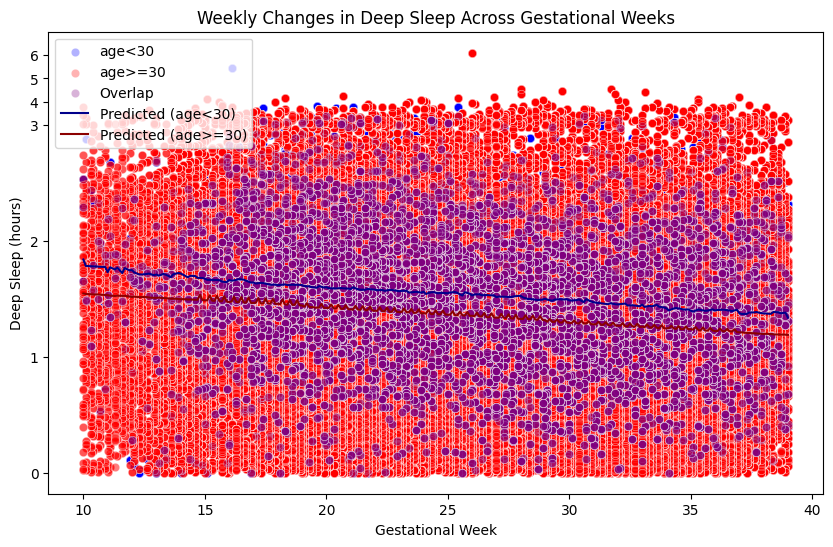

In [109]:
plt.figure(figsize=(10, 6))
# Scatter plot for age < 30 without overlap
sns.scatterplot(x='time', y='deep_under30', data=df_merged[~df_merged['overlap']], color='blue', alpha=0.3, label='age<30')

# Scatter plot for age >= 30 without overlap
sns.scatterplot(x='time', y='deep_over30', data=df_merged[~df_merged['overlap']], color='red', alpha=0.3, label='age>=30')

# Scatter plot for overlap in purple
sns.scatterplot(x='time', y='deep_under30', data=df_merged[df_merged['overlap']], color='purple', alpha=0.3, label='Overlap')

# Line plots for predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c == 0], color='darkblue', label='Predicted (age<30)', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep_stretched', data=df_w_static[df_w_static.age_c == 1], color='darkred', label='Predicted (age>=30)', errorbar=None)

# Y-axis ticks stretching
plt.yticks([stretch_y(y) for y in range(0, 7)], range(0, 7))

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [56]:
df_w_static.head()

,record_id,daysSince,deep,rem,light,total,temperature_delta,temperature_deviation,temperature_trend_deviation,gestage_week,...,EED_a2,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id,Gestational_week,PredictedDeepSleep
0,direct_10,-7.0,1.19,1.92,3.56,6.68,-0.09,-0.09,0.05,40.0,...,True,3,39.0,3,0,0,1,0,39.0,1.183715
1,direct_10,-9.0,1.08,2.01,4.05,7.13,-0.03,-0.03,0.10,40.0,...,True,3,38.7,3,0,0,1,0,39.0,1.187517
2,direct_10,-10.0,1.40,1.87,3.41,6.68,0.02,0.02,0.12,40.0,...,True,3,38.6,3,0,0,1,0,39.0,1.188785
3,direct_10,-11.0,1.10,2.00,5.01,8.11,0.03,0.03,0.07,40.0,...,True,3,38.4,3,0,0,1,0,38.0,1.191320
4,direct_10,-12.0,0.72,1.39,4.51,6.62,0.02,0.02,0.00,40.0,...,True,3,38.3,3,0,0,1,0,38.0,1.192587


In [57]:
model_formula = 'deep ~ age + bmi + EED_g + n_prev_baby + GW_class:EED_g + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

print(mixedlm_result.summary())

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: deep       
No. Observations:  51343   Method:             REML       
No. Groups:        385     Scale:              0.1872     
Min. group size:   5       Log-Likelihood:     -30882.7034
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       1.441    0.272   5.290 0.000  0.907  1.975
age            -0.005    0.005  -1.033 0.301 -0.015  0.005
bmi             0.012    0.007   1.747 0.081 -0.002  0.026
EED_g           0.035    0.026   1.354 0.176 -0.016  0.086
n_prev_baby     0.013    0.018   0.737 0.461 -0.022  0.049
GW_class:EED_g -0.012    0.002  -5.329 0.000 -0.017 -0.008
GW_class:bmi_c -0.035    0.005  -6.879 0.000 -0.045 -0.025
bmi_c:ag

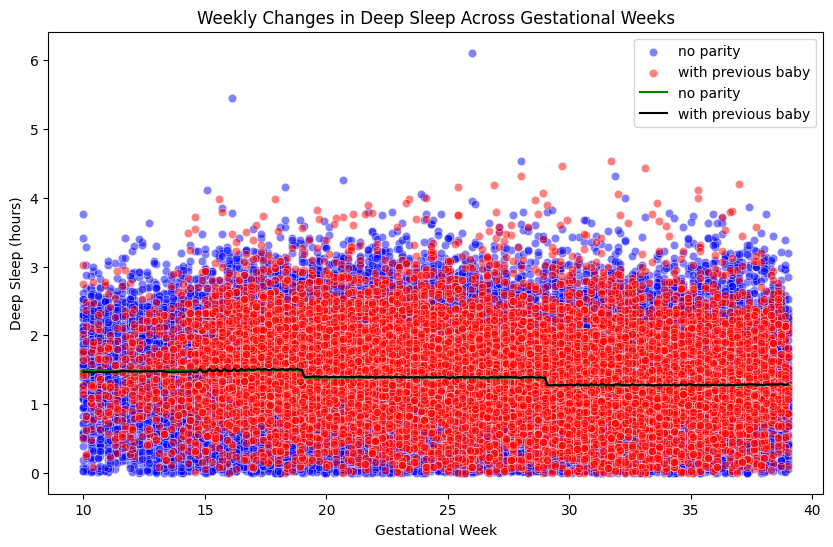

In [58]:
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.n_prev_baby==0], color='blue', alpha=0.5, label='no parity')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.n_prev_baby>0], color='red', alpha=0.5, label='with previous baby')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.n_prev_baby==0], color='green', label='no parity', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.n_prev_baby==1], color='black', label='with previous baby', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [59]:
df_w_static

,record_id,daysSince,deep,rem,light,total,temperature_delta,temperature_deviation,temperature_trend_deviation,gestage_week,...,EED_a2,EED_g,time,GW_class,bmi_c,bmi_c2,age_c,map_id,Gestational_week,PredictedDeepSleep
0,direct_10,-7.0,1.19,1.92,3.56,6.68,-0.09,-0.09,0.05,40.0,...,True,3,39.0,3,0,0,1,0,39.0,1.287984
1,direct_10,-9.0,1.08,2.01,4.05,7.13,-0.03,-0.03,0.10,40.0,...,True,3,38.7,3,0,0,1,0,39.0,1.287984
2,direct_10,-10.0,1.40,1.87,3.41,6.68,0.02,0.02,0.12,40.0,...,True,3,38.6,3,0,0,1,0,39.0,1.287984
3,direct_10,-11.0,1.10,2.00,5.01,8.11,0.03,0.03,0.07,40.0,...,True,3,38.4,3,0,0,1,0,38.0,1.287984
4,direct_10,-12.0,0.72,1.39,4.51,6.62,0.02,0.02,0.00,40.0,...,True,3,38.3,3,0,0,1,0,38.0,1.287984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51338,sema4_992,-134.0,2.75,1.15,2.88,6.78,-0.35,-0.35,-0.13,37.0,...,False,1,17.9,1,1,0,0,384,18.0,1.598807
51339,sema4_992,-135.0,2.58,1.29,4.03,7.89,-0.07,-0.07,0.00,37.0,...,False,1,17.7,1,1,0,0,384,18.0,1.598807
51340,sema4_992,-136.0,2.00,1.23,4.32,7.54,-0.02,-0.02,0.01,37.0,...,False,1,17.6,1,1,0,0,384,18.0,1.598807
51341,sema4_992,-137.0,2.08,1.15,4.45,7.68,-0.05,-0.05,0.01,37.0,...,False,1,17.4,1,1,0,0,384,17.0,1.598807


In [60]:
df_grouped = df_w_static.loc[:,['record_id','map_id','time','GW_class','deep','age_c','bmi_c','n_prev_baby']].copy()
df_grouped['parity'] = 0
df_grouped.loc[df_grouped.n_prev_baby>0, 'parity'] = 1 
stat_id = df_grouped.groupby('record_id')[['map_id','age_c','bmi_c','parity']].first().reset_index()

time_range = np.sort(df_w_static.time.unique())
#time_range = np.arange(10.0, 39.1, 0.1)

time_df = pd.DataFrame(time_range, columns=['time'])
time_df['key'] = 0
record_df = pd.DataFrame(df_grouped['record_id'].unique(), columns=['record_id'])
record_df['key'] = 0

# Cartesian product of record_ids and time_range
full_df = pd.merge(record_df, time_df, on='key').drop(columns=['key'])
full_df['time'] = full_df['time'].round(1).astype(float)

# Merge this with original data
df_grouped = pd.merge(full_df, df_grouped, on=['record_id', 'time'], how='left')
c2=df_grouped.time.gt(19)&df_grouped.time.le(29)
c3=df_grouped.time.gt(29)&df_grouped.time.le(39)
df_grouped.loc[df_grouped.time.le(19),'GW_class'] = 1.0
df_grouped.loc[c2,'GW_class'] = 2.0
df_grouped.loc[c3,'GW_class'] = 3.0


In [61]:
part_df = df_grouped.groupby(['record_id','GW_class'])[['deep']].apply(lambda x: x.isna().sum()).reset_index()
part_df.rename(columns={'deep': 'participation'}, inplace=True)
part_df = pd.merge(part_df, stat_id, on=['record_id'], how='left')


In [62]:
part_df.head()

,record_id,GW_class,participation,map_id,age_c,bmi_c,parity
0,direct_10,1.0,25,0,1,0,1
1,direct_10,2.0,32,0,1,0,1
2,direct_10,3.0,25,0,1,0,1
3,direct_109,1.0,23,1,1,0,0
4,direct_109,2.0,50,1,1,0,0


In [63]:
# Perform t-test to compare participation based on parity
segment = 2.0
parity_participation = part_df[(part_df['parity'] == 1)&(part_df['GW_class'] == segment)]['participation']
no_parity_participation = part_df[(part_df['parity'] == 0)&(part_df['GW_class'] == segment)]['participation']

t_stat, p_value = ttest_ind(parity_participation, no_parity_participation)

print(f"T-test results: t_stat = {t_stat}, p_value = {p_value}")

T-test results: t_stat = -1.9428679114592313, p_value = 0.0527645890217107


In [64]:
t_stat, p_value = ttest_ind(parity_participation, no_parity_participation, equal_var=False) #Welch’s t-test

print(f"T-test results: t_stat = {t_stat}, p_value = {p_value}")

T-test results: t_stat = -2.1525059588866036, p_value = 0.032717868004672725


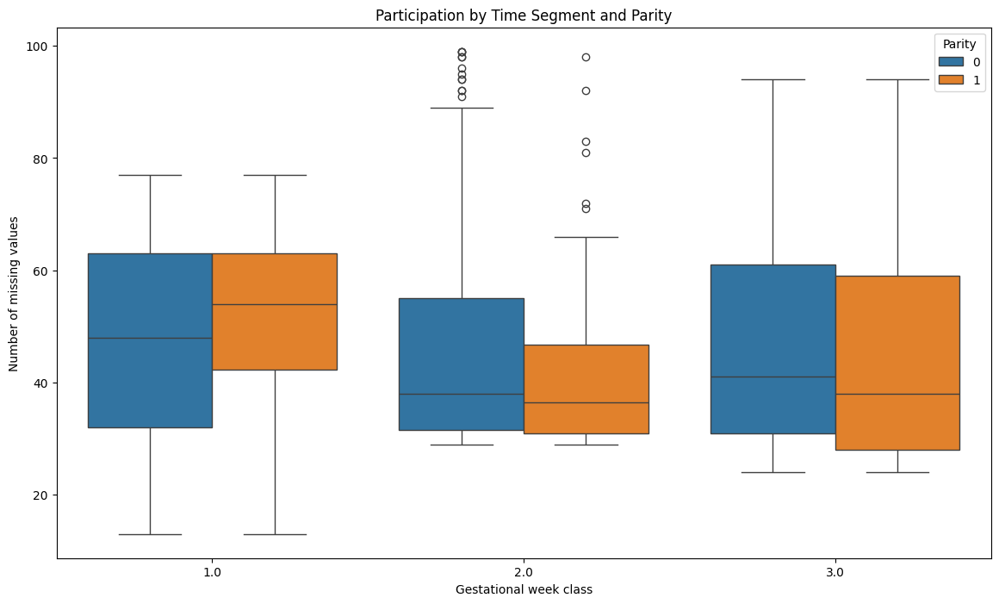

In [65]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='GW_class', y='participation', hue='parity', data=part_df)
plt.title('Participation by Time Segment and Parity')
plt.xlabel('Gestational week class')
plt.ylabel('Number of missing values')
plt.legend(title='Parity')
plt.show()

In [66]:
for segment in [1.0, 2.0, 3.0]:
    segment_data = part_df[part_df['GW_class'] == segment]
    model = smf.ols('participation ~ parity', data=segment_data).fit()
    print(f"Time segment: {segment}")
    print(model.summary())

Time segment: 1.0
                            OLS Regression Results                            
Dep. Variable:          participation   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.390
Date:                Tue, 16 Jul 2024   Prob (F-statistic):              0.123
Time:                        17:36:09   Log-Likelihood:                -1671.2
No. Observations:                 385   AIC:                             3346.
Df Residuals:                     383   BIC:                             3354.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     46.9661      1.084  

In [67]:
# Calculate second derivative (using finite difference method)
df_w_static = df_w_static.sort_values(by='time')
df_w_static['first_derivative'] = np.gradient(df_w_static['PredictedDeepSleep'], df_w_static['deep'])
df_w_static['second_derivative'] = np.gradient(df_w_static['first_derivative'], df_w_static['deep'])

# Find the inflection point
inflection_loc = np.array(df_w_static['second_derivative'][:-1])* np.array(df_w_static['second_derivative'][1:])
inflection_point = df_w_static.loc[:, ['deep','time']].iloc[np.argmax(inflection_loc < 0)]


/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1242: RuntimeWarning: divide by zero encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1242: RuntimeWarning: invalid value encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1243: RuntimeWarning: divide by zero encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1243: RuntimeWarning: invalid value encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1244: RuntimeWarning: divide by zero encountered in divide
  c = dx1 / (dx2 * (dx1 + dx2))
/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1244: RuntimeWarning: invalid value

In [68]:
inflection_point

deep     2.02
time    10.00
Name: 16763, dtype: float64

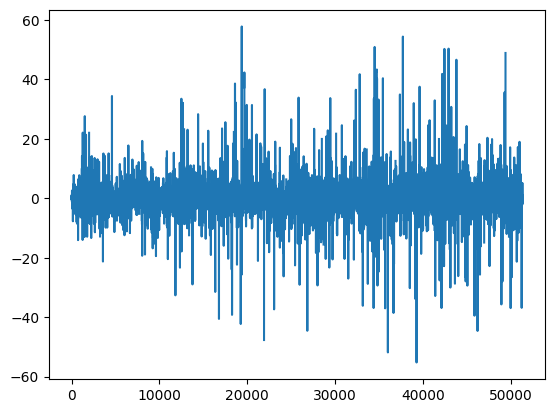

In [69]:
plt.plot(np.array(df_w_static['first_derivative']))

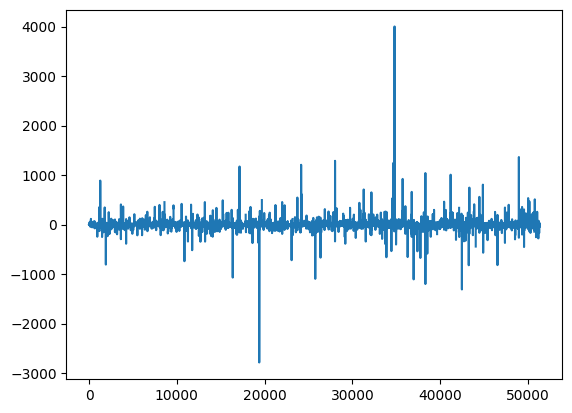

In [70]:
plt.plot(np.array(df_w_static['second_derivative']))

In [71]:
inflection_point

deep     2.02
time    10.00
Name: 16763, dtype: float64

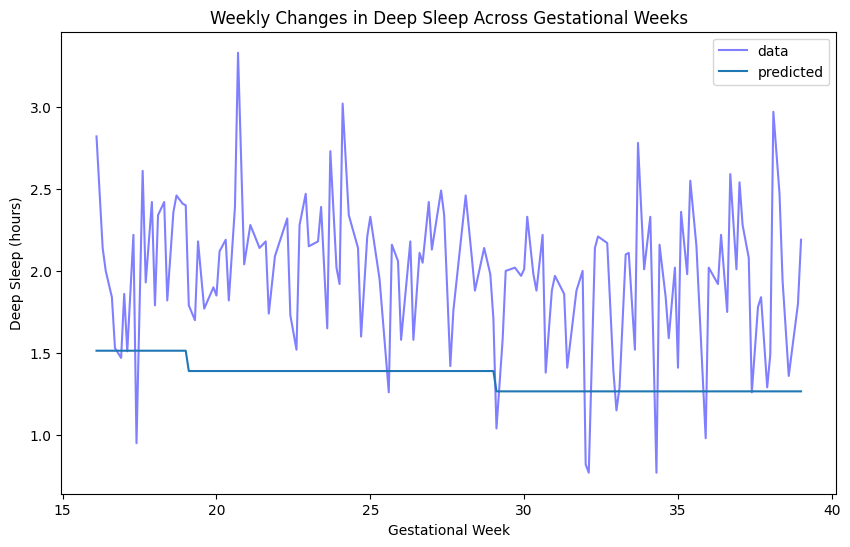

In [72]:
subset = df_w_static.loc[df_w_static.record_id==super_healthy_id[10]]
subset = subset.sort_values(by='time')
predict_res = mixedlm_result.predict(subset)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.lineplot(x='time', y='deep', data=subset, color='blue', alpha=0.5, label='data')

# Line plot of predicted deep sleep times
plt.plot(np.array(subset.time), predict_res, label='predicted')

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

### Other sleeep parameters 

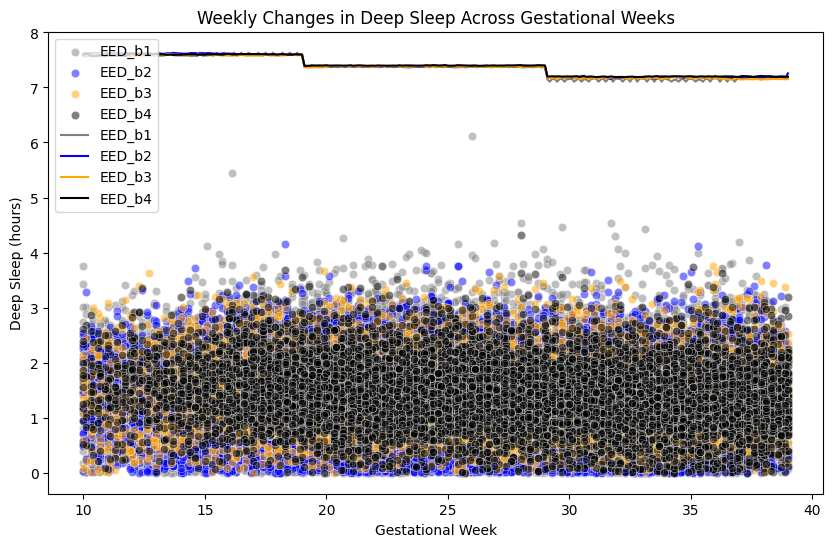

In [113]:
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.EED_g==0], color='gray', alpha=0.5, label='EED_b1')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.EED_g==1], color='blue', alpha=0.5, label='EED_b2')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.EED_g==2], color='orange', alpha=0.5, label='EED_b3')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.EED_g==3], color='black', alpha=0.5, label='EED_b4')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.EED_g==0], color='gray', label='EED_b1', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.EED_g==1], color='blue', label='EED_b2', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.EED_g==2], color='orange', label='EED_b3', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.EED_g==3], color='black', label='EED_b4', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [56]:
#"""
model_formula = 'rem ~ time:bmi + bmi:age + time:age'# + time:bmi'
model_formula = 'deep ~ age + bmi + time + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())
#"""
var_components = mixedlm_result.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: deep       
No. Observations:  51343   Method:             REML       
No. Groups:        385     Scale:              0.1859     
Min. group size:   5       Log-Likelihood:     -30696.1459
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       1.723    0.266   6.489 0.000  1.203  2.243
age            -0.010    0.005  -1.886 0.059 -0.020  0.000
bmi             0.014    0.007   1.942 0.052 -0.000  0.027
time           -0.012    0.001 -19.869 0.000 -0.013 -0.010
GW_class:bmi_c -0.017    0.005  -3.239 0.001 -0.027 -0.007
bmi_c:age_c    -0.089    0.082  -1.083 0.279 -0.251  0.072
GW_class:age_c -0.004    0.006  -0.696 0.486 -0.016  0.008
Group Va

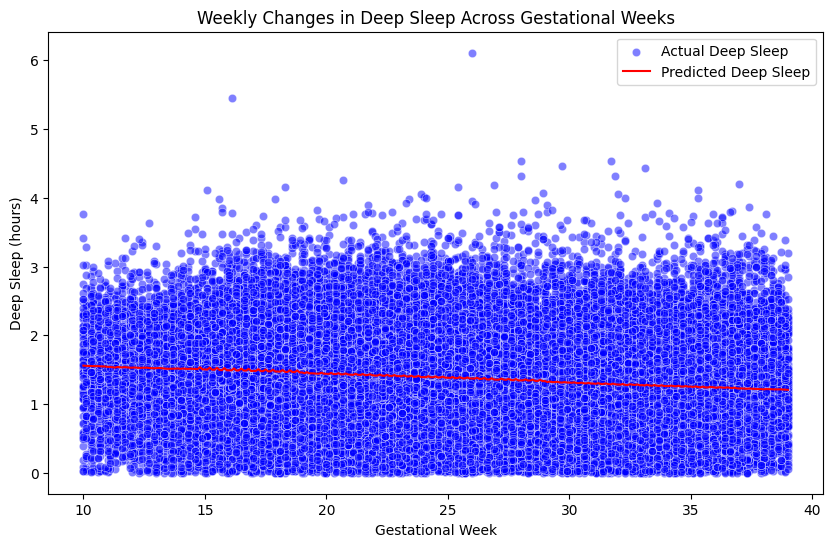

In [57]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='deep', data=df_w_static, color='blue', alpha=0.5, label='Actual Deep Sleep')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Deep Sleep', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

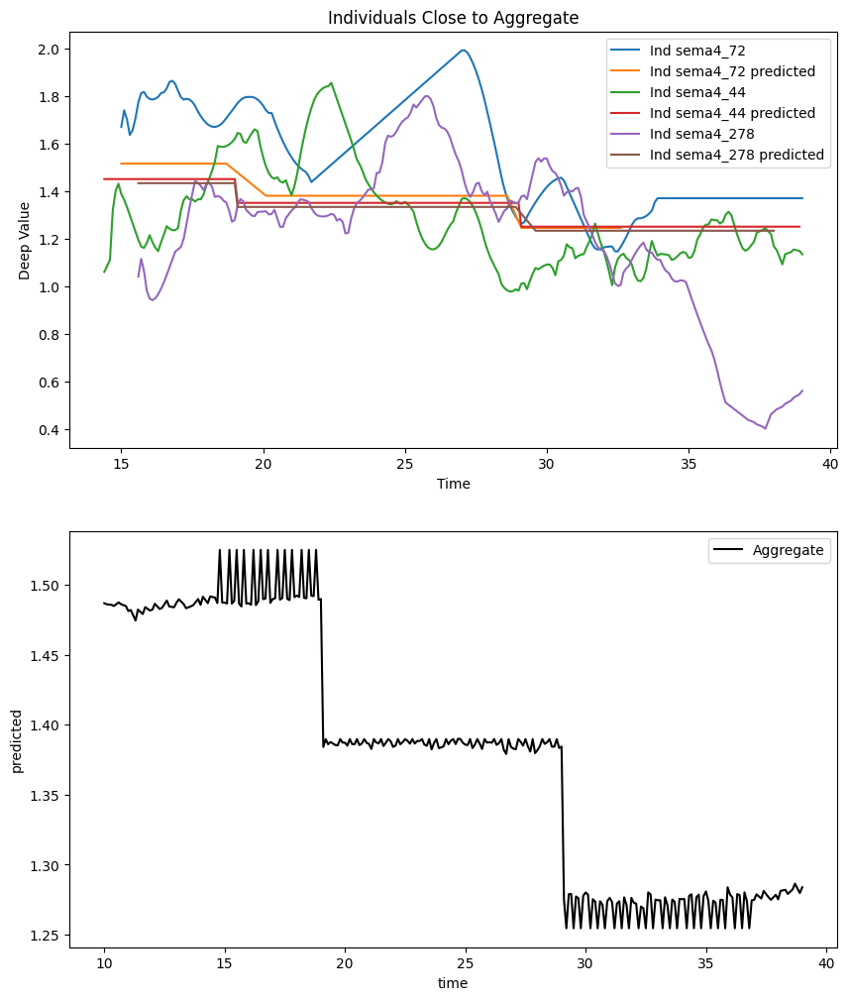

In [53]:
data = df_w_static.loc[:,['time','map_id','deep','record_id']].copy()
fixed_effects = mixedlm_result.fittedvalues
#data['predicted'] = fixed_effects + mixedlm_result.random_effects[data['map_id']].values
data['predicted'] = mixedlm_result.predict(df_w_static)
data['residuals'] = data['deep'] - data['predicted']
rmse = data.groupby('record_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))
# Select individuals with the lowest and highest RMSE
low_rmse_individuals = rmse.nsmallest(3).index
high_rmse_individuals = rmse.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()

In [54]:
df_w_static['smoothed_deep'] = df_w_static.groupby('record_id')['deep'].rolling(window=14, min_periods=1).mean().reset_index(drop=True)


In [ ]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='smoothed_deep', data=df_w_static, color='blue', alpha=0.5, label='Actual Deep Sleep')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Deep Sleep', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

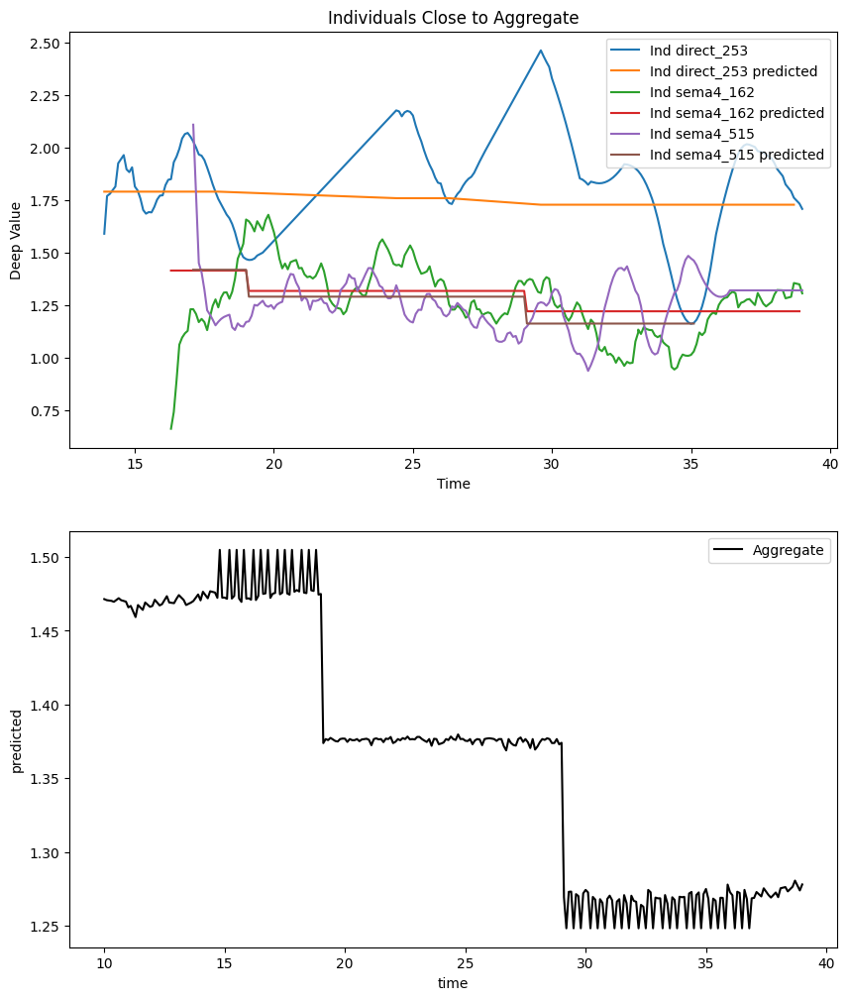

In [57]:
data = df_w_static.loc[:,['time','map_id','smoothed_deep','record_id']].copy()
fixed_effects = mixedlm_result.fittedvalues
#data['predicted'] = fixed_effects + mixedlm_result.random_effects[data['map_id']].values
data['predicted'] = mixedlm_result.predict(df_w_static)
data['residuals'] = data['smoothed_deep'] - data['predicted']
rmse = data.groupby('record_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))
# Select individuals with the lowest and highest RMSE
low_rmse_individuals = rmse.nsmallest(3).index
high_rmse_individuals = rmse.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()

In [58]:
from scipy.stats import linregress
def calculate_slope(group):
    if len(group) < 2:
        return np.nan
    x = np.arange(len(group))
    slope, _, _, _, _ = linregress(x, group)
    return slope

In [59]:
df_w_static = df_w_static.sort_values(by=['record_id', 'time']).reset_index(drop=True)
slopes = df_w_static.groupby('record_id')['smoothed_deep'].apply(calculate_slope) #smoothed_deep, deep
slopes_2nd = df_w_static.groupby('record_id')['PredictedDeepSleep'].apply(calculate_slope)

In [60]:
# Identify record_id with the most negative slopes (indicating decreasing 'deep' values)
record_id_most_decreasing = slopes.idxmin()

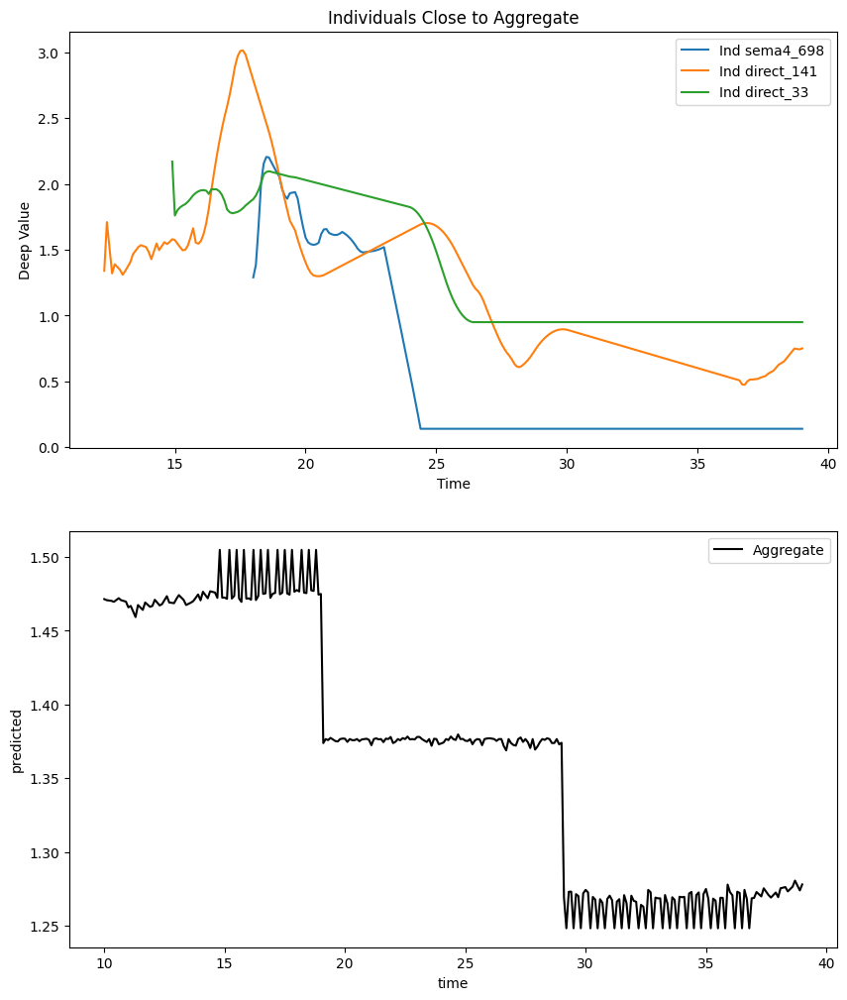

In [61]:
deducted_slopes =  slopes - slopes_2nd

low_rmse_individuals = deducted_slopes.nsmallest(3).index
high_rmse_individuals = deducted_slopes.nlargest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    #axs[0].plot(part_pre['time'], part_pre['predicted'], linestyle='-', label=f'Ind {xind} predicted')
#axs[0].plot(data['time'], fixed_effects, color='black', label='Aggregate')
sns.lineplot(x='time', y='predicted', data=data, color='black', label='Aggregate', errorbar=None)
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()

In [70]:
deducted_slopes_super_healthy = deducted_slopes[deducted_slopes.index.isin(super_healthy_id)]
deducted_slopes_others = deducted_slopes[~deducted_slopes.index.isin(super_healthy_id)]
comparison = {
    'Super Healthy': deducted_slopes_super_healthy.mean()/np.abs(slopes_2nd.mean()),
    'Others': deducted_slopes_others.mean()/np.abs(slopes_2nd.mean())
}
print(comparison)

{'Super Healthy': -1.0498483575338435, 'Others': -0.24349010213503094}


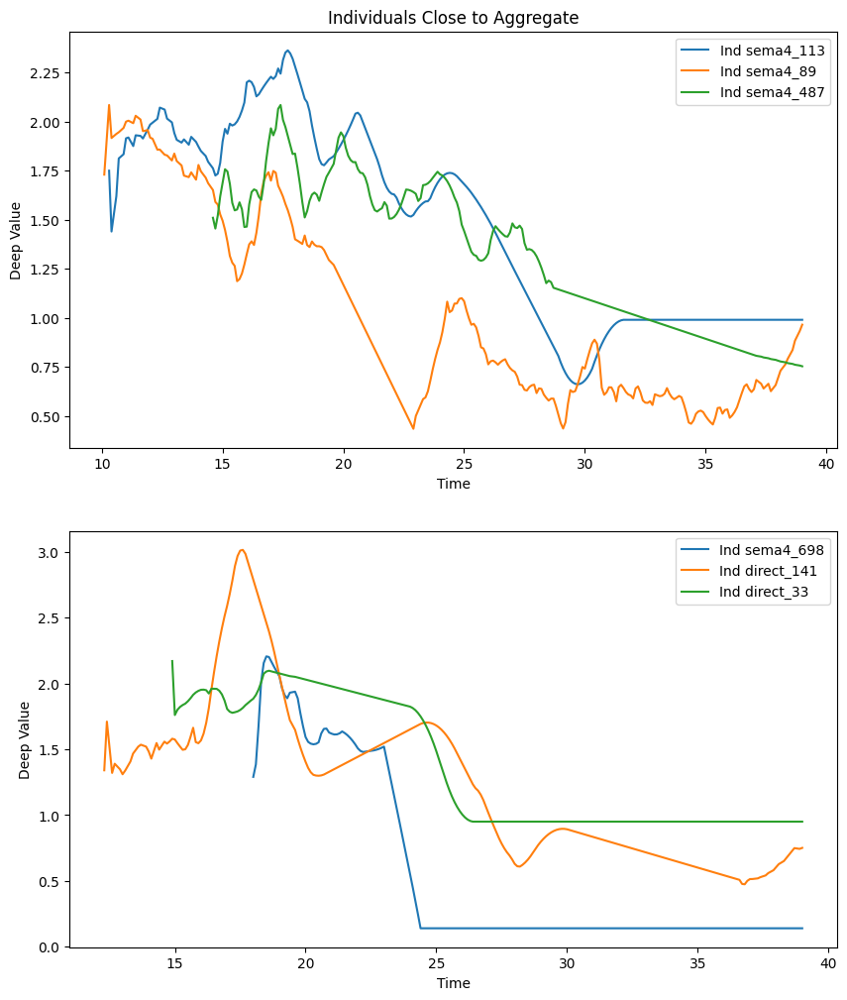

In [101]:
low_rmse_individuals = deducted_slopes_super_healthy.nsmallest(3).index

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot individuals close to aggregate
for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[0].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
    
low_rmse_individuals = deducted_slopes_others.nsmallest(3).index

for ind in low_rmse_individuals:
    ind_data = df_grouped[df_grouped['record_id'] == ind]
    ind_data = ind_data.sort_values(by='time')
    part_pre = data.loc[data['record_id']==ind, ['time','predicted']]
    part_pre = part_pre.sort_values(by='time')

    ind_data['deep'].interpolate(inplace=True)
    smoothed_values = ind_data['deep'].rolling(window=14, min_periods=1).mean()
    # Replace original 'deep' column with smoothed values
    ind_data['deep'] = smoothed_values
    xind = data.loc[data.record_id==ind].record_id.iloc[0]
    axs[1].plot(ind_data['time'], ind_data['deep'], linestyle='-', label=f'Ind {xind}')
axs[0].set_title('Individuals Close to Aggregate')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Deep Value')
axs[0].legend()
axs[1].set_title('Individuals Close to Aggregate')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Deep Value')
axs[1].legend()

In [83]:
df_slopes = pd.DataFrame({
    'record_id': deducted_slopes.index,
    'deducted_slope': deducted_slopes.values
}).set_index('record_id')

#part_df = part_df.join(df_slopes, on='record_id')
part_df = pd.merge(part_df, static_feat2, on=['record_id'], how='left')

In [95]:
part_df.columns

Index(['record_id', 'GW_class', 'participation', 'map_id', 'age_c', 'bmi_c',
       'parity', 'deducted_slope', 'gestage_week', 'age', 'weight_pre', 'bmi',
       'n_prev_baby', 'birth_mode', 'induction_yn', 'EED_b1', 'EED_b2',
       'EED_a1', 'EED_a2', 'EED_g'],
      dtype='object')

In [117]:
aggregate_slope = deducted_slopes.mean()

# Function to find subgroups with slopes close to aggregate slope
def find_closest_subgroups(df, feature, aggregate_slope, n_closest=5):
    print(df.groupby(feature)['deducted_slope'].count())
    subgroups = df.groupby(feature)['deducted_slope'].mean()
    closest_subgroups = (subgroups - aggregate_slope).abs().nsmallest(n_closest)
    values = closest_subgroups.values / aggregate_slope
    closest_subgroups = closest_subgroups.index
    return closest_subgroups, values.round(3)

# Example: Find subgroups for each static feature
#features = ['age', 'weight_pre', 'bmi', 'n_prev_baby']
#features = ['participation', 'age_c', 'bmi_c', 'parity']
features = ['birth_mode', 'induction_yn', 'EED_b1', 'EED_b2','EED_a1', 'EED_a2', 'EED_g']
closest_subgroups = {}
closest_subgroups_val = {}

for feature in features:
    closest_subgroups[feature], closest_subgroups_val[feature] = find_closest_subgroups(part_df, feature, aggregate_slope)

print("Subgroups with slopes closest to aggregate slope:")
for feature, subgroups in closest_subgroups.items():
    print(f"{feature}: {subgroups.tolist()}")
    print(f"{feature}: {closest_subgroups_val[feature].tolist()}")
    

birth_mode
1.0    369
2.0    807
Name: deducted_slope, dtype: int64
induction_yn
0.0    792
1.0    384
Name: deducted_slope, dtype: int64
EED_b1
False    690
True     486
Name: deducted_slope, dtype: int64
EED_b2
False    825
True     351
Name: deducted_slope, dtype: int64
EED_a1
False    1044
True      132
Name: deducted_slope, dtype: int64
EED_a2
False    969
True     207
Name: deducted_slope, dtype: int64
EED_g
0    486
1    351
2    132
3    207
Name: deducted_slope, dtype: int64
Subgroups with slopes closest to aggregate slope:
birth_mode: [2.0, 1.0]
birth_mode: [-0.673, -1.44]
induction_yn: [0.0, 1.0]
induction_yn: [-0.113, -0.203]
EED_b1: [False, True]
EED_b1: [-0.442, -0.651]
EED_b2: [False, True]
EED_b2: [-0.153, -0.392]
EED_a1: [False, True]
EED_a1: [-0.413, -3.181]
EED_a2: [False, True]
EED_a2: [-0.035, -0.11]
EED_g: [3, 1, 0, 2]
EED_g: [-0.11, -0.392, -0.651, -3.181]


In [116]:
1056/3

352.0

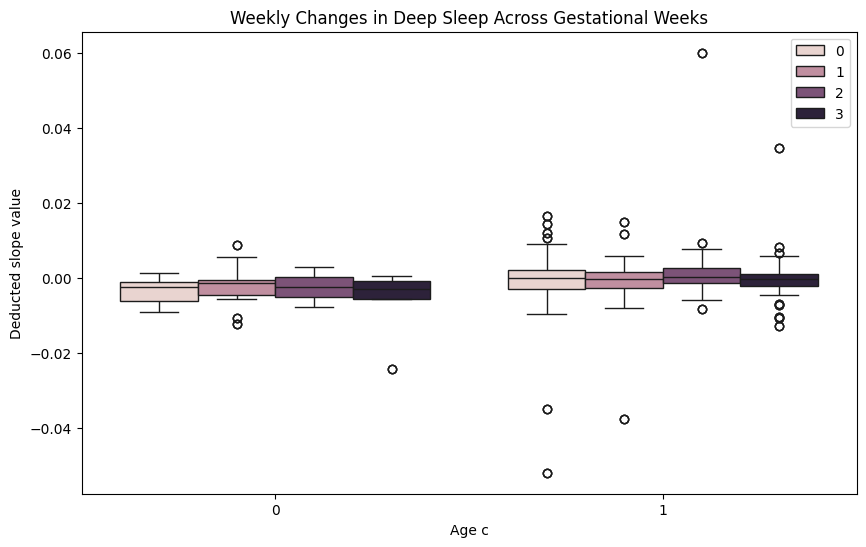

In [120]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='age_c', y='deducted_slope', hue='EED_g', data=part_df)
#plt.scatter(part_df['record_id'].iloc[500], aggregate_slope, color='black', s=100, label='Aggregate Slope')

plt.xlabel('Age c')
plt.ylabel('Deducted slope value')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [121]:
from scipy.stats import f_oneway #ANOVA test

group_0 = part_df[part_df['EED_g'] == 0]['deducted_slope']
group_1 = part_df[part_df['EED_g'] == 1]['deducted_slope']
group_2 = part_df[part_df['EED_g'] == 2]['deducted_slope']
group_3 = part_df[part_df['EED_g'] == 3]['deducted_slope']

f_stat, p_value = f_oneway(group_0, group_1, group_2, group_3)

print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value}")

F-statistic: 4.7421375987772585
P-value: 0.002712010424477862


In [111]:
part_df.columns

Index(['record_id', 'GW_class', 'participation', 'map_id', 'age_c', 'bmi_c',
       'parity', 'deducted_slope', 'gestage_week', 'age', 'weight_pre', 'bmi',
       'n_prev_baby', 'birth_mode', 'induction_yn', 'EED_b1', 'EED_b2',
       'EED_a1', 'EED_a2', 'EED_g'],
      dtype='object')

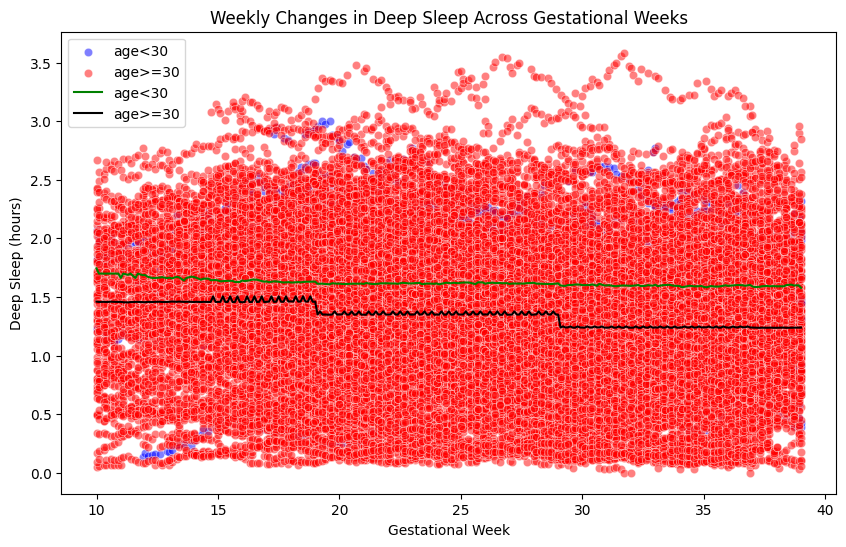

In [101]:
# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='smoothed_deep', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.5, label='age<30')
sns.scatterplot(x='time', y='smoothed_deep', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.5, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==0], color='green', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==1], color='black', label='age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [63]:
df_birth.columns

Index(['user_id', 'record_id', 'redcap_event_name', 'date', 'birth_number',
       'birth_date', 'birth_scheduled', 'birth_scheduled_unsure',
       'birth_gestage', 'birth_mode', 'induction_yn', 'induction_reason',
       'vacuumforceps', 'vaginalaftercesarean', 'birth_c_type',
       'birth_incision', 'birth_indication', 'birth_apgar1', 'birth_apgar2',
       'birth_abnormal1', 'birth_describe1', 'conditionsknown',
       'birth_abnormal2', 'birth_describe2', 'conditionsknown_2',
       'birth_maternal___1', 'birth_maternal___2', 'birth_maternal___4',
       'hypertension', 'hellpsyndrome', 'birth_urine', 'postparhem',
       'hem_meds', 'birth_matmorbid', 'birth_describe', 'birth_stay',
       'birth_stay_baby', 'birth_stay_baby_yes', 'birth_feeding',
       'birth_matleave', 'birth_mat_leave_length',
       'birthing_data_cohort_2_only_complete'],
      dtype='object')

In [97]:
deducted_slopes

record_id
direct_10     0.000624
direct_109   -0.003440
direct_113   -0.000687
direct_116   -0.000999
direct_118   -0.000701
                ...   
sema4_984    -0.000737
sema4_989    -0.003250
sema4_990     0.001420
sema4_991    -0.001356
sema4_992    -0.001565
Length: 385, dtype: float64

In [95]:
part_df

,record_id,GW_class,participation,map_id,age_c,bmi_c,parity
0,direct_10,1.0,25,0,1,0,1
1,direct_10,2.0,32,0,1,0,1
2,direct_10,3.0,25,0,1,0,1
3,direct_109,1.0,23,1,1,0,0
4,direct_109,2.0,50,1,1,0,0
...,...,...,...,...,...,...,...
1150,sema4_991,2.0,35,383,1,0,0
1151,sema4_991,3.0,25,383,1,0,0
1152,sema4_992,1.0,64,384,0,1,0
1153,sema4_992,2.0,30,384,0,1,0


In [ ]:
super_healthy_id

In [94]:
rmse = data.groupby('map_id')['residuals'].apply(lambda x: np.sqrt(np.mean(x**2)))

In [97]:
rmse.nsmallest(3).index

Index([319, 235, 176], dtype='int64', name='map_id')

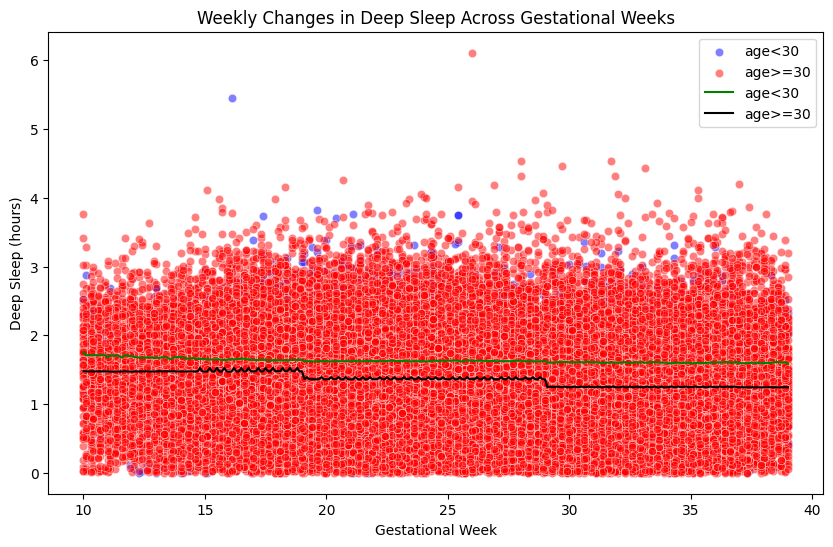

In [107]:
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.age_c==0], color='blue', alpha=0.5, label='age<30')
sns.scatterplot(x='time', y='deep', data=df_w_static[df_w_static.age_c==1], color='red', alpha=0.5, label='age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==0], color='green', label='age<30', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[df_w_static.age_c==1], color='black', label='age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Deep Sleep (hours)')
plt.title('Weekly Changes in Deep Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [131]:
formula = 'rem ~ time + bmi + age' #time*bmi, time*age
model_rem = smf.mixedlm(formula, df_w_static, groups=df_w_static['map_id'])
result_rem = model_rem.fit()
print(result_rem.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rem        
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.2519     
Min. group size:  5       Log-Likelihood:     -38401.3543
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
----------------------------------------------------------
           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
----------------------------------------------------------
Intercept   1.267     0.202   6.260  0.000   0.871   1.664
time        0.011     0.000  36.320  0.000   0.011   0.012
bmi        -0.000     0.005  -0.059  0.953  -0.009   0.009
age         0.003     0.004   0.678  0.498  -0.006   0.012
Group Var   0.253     0.037                               



In [138]:
model_formula = 'rem ~ age + bmi + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c'# + time:bmi'

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())
var_components = mixedlm_result.cov_re.iloc[0, 0]  # Random effects variance (tau^2)
residual_variance = mixedlm_result.scale            # Residual variance (sigma^2)

# Calculate ICC
icc = var_components / (var_components + residual_variance)

print(f"Interclass Correlation Coefficient (ICC): {icc:.3f}")

# Interpretation
if icc < 0.1:
    print("Little, if any, group variability.")
elif icc < 0.5:
    print("Moderate group variability.")
else:
    print("Substantial group variability.")

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rem        
No. Observations: 51343   Method:             REML       
No. Groups:       385     Scale:              0.2526     
Min. group size:  5       Log-Likelihood:     -38480.1137
Max. group size:  328     Converged:          Yes        
Mean group size:  133.4                                  
---------------------------------------------------------
               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       1.876    0.243  7.707 0.000  1.399  2.353
age            -0.008    0.005 -1.693 0.091 -0.017  0.001
bmi            -0.008    0.006 -1.267 0.205 -0.021  0.004
GW_class:bmi_c -0.008    0.006 -1.326 0.185 -0.019  0.004
bmi_c:age_c     0.154    0.076  2.025 0.043  0.005  0.302
GW_class:age_c  0.112    0.004 27.672 0.000  0.104  0.120
Group Var       0.253    0.037                           

Interclass Correlation 

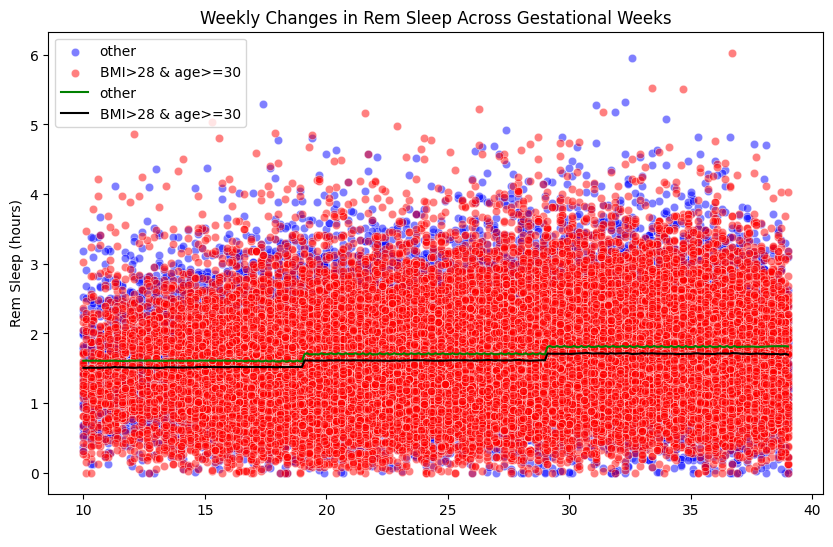

In [133]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)
#df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)


# Plotting
indices = (df_w_static.bmi_c==1)&(df_w_static.age_c==1)

plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='rem', data=df_w_static[indices], color='blue', alpha=0.5, label='other')
sns.scatterplot(x='time', y='rem', data=df_w_static[~indices], color='red', alpha=0.5, label='BMI>28 & age>=30')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[indices], color='green', label='other', errorbar=None)
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static[~indices], color='black', label='BMI>28 & age>=30', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Rem Sleep (hours)')
plt.title('Weekly Changes in Rem Sleep Across Gestational Weeks')
plt.legend()

plt.show()

In [108]:
model_formula = 'total ~ age + bmi + GW_class:bmi_c + bmi_c:age_c + GW_class:age_c' #light

# Fit the mixed effects linear model
mixedlm_model = smf.mixedlm(model_formula, df_w_static, groups=df_w_static['map_id'])#, re_formula="~time")
mixedlm_result = mixedlm_model.fit()

# Print the results
print(mixedlm_result.summary())

          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: total      
No. Observations:  51343   Method:             REML       
No. Groups:        385     Scale:              1.0976     
Min. group size:   5       Log-Likelihood:     -76011.0178
Max. group size:   328     Converged:          Yes        
Mean group size:   133.4                                  
----------------------------------------------------------
               Coef.  Std.Err.    z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       8.298    0.321  25.837 0.000  7.669  8.928
age            -0.003    0.006  -0.539 0.590 -0.016  0.009
bmi            -0.020    0.009  -2.386 0.017 -0.037 -0.004
GW_class:bmi_c -0.066    0.012  -5.448 0.000 -0.089 -0.042
bmi_c:age_c     0.340    0.101   3.369 0.001  0.142  0.538
GW_class:age_c -0.198    0.008 -23.581 0.000 -0.214 -0.181
Group Var       0.433    0.031                            



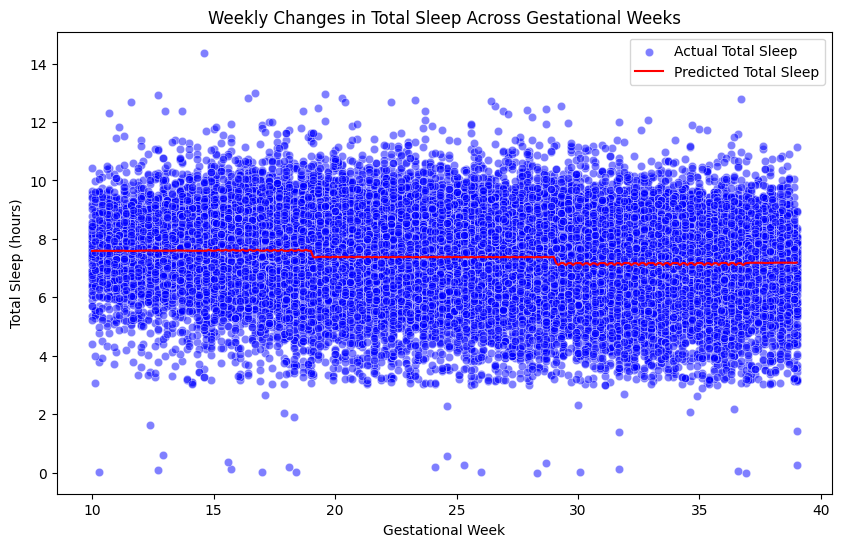

In [109]:
df_w_static['PredictedDeepSleep'] = mixedlm_result.predict(df_w_static)

# Plotting
plt.figure(figsize=(10, 6))

# Scatter plot of actual deep sleep times
sns.scatterplot(x='time', y='total', data=df_w_static, color='blue', alpha=0.5, label='Actual Total Sleep')

# Line plot of predicted deep sleep times
sns.lineplot(x='time', y='PredictedDeepSleep', data=df_w_static, color='red', label='Predicted Total Sleep', errorbar=None)

plt.xlabel('Gestational Week')
plt.ylabel('Total Sleep (hours)')
plt.title('Weekly Changes in Total Sleep Across Gestational Weeks')
plt.legend()

plt.show()

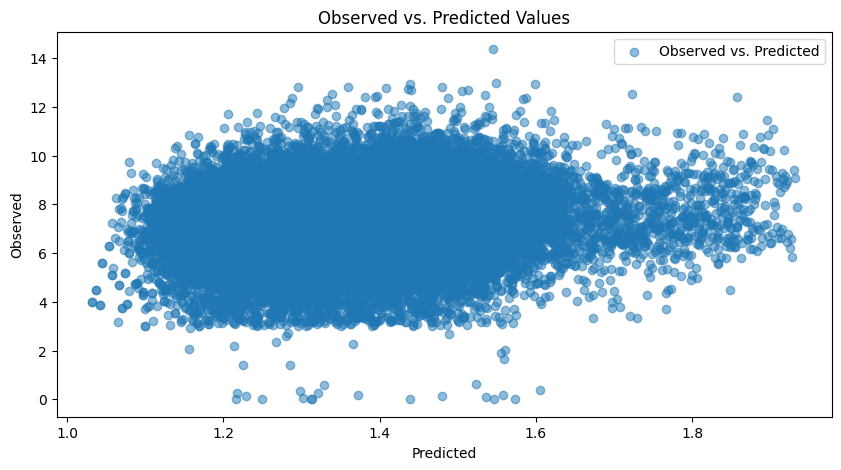

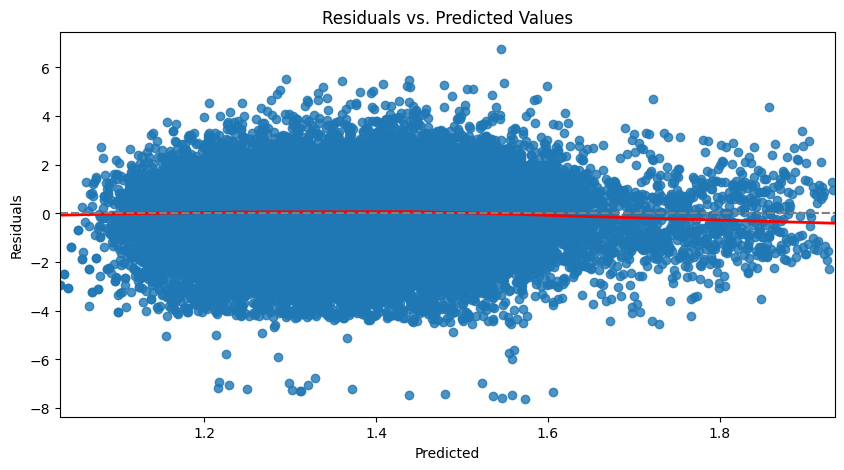

In [110]:
predictions = result.predict(df_w_static[['time', 'bmi', 'age']])

# Calculate residuals
residuals = df_w_static['total'] - predictions

# Plot observed vs. predicted values
plt.figure(figsize=(10, 5))
plt.scatter(predictions, df_w_static['total'], alpha=0.5, label='Observed vs. Predicted')
#plt.plot([df_w_static['total'].min(), df_w_static['total'].max()], [df_w_static['total'].min(), df_w_static['total'].max()], 'k--', lw=2, label='Perfect Fit')
plt.xlabel('Predicted')
plt.ylabel('Observed')
plt.title('Observed vs. Predicted Values')
plt.legend()
plt.show()

# Plot residuals
plt.figure(figsize=(10, 5))
sns.residplot(x=predictions, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 2})
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Values')
plt.axhline(y=0, color='grey', linestyle='--')
plt.show()

In [ ]:
## Regression model
#results = smf.ols('deep ~ time + np.log(rmssd)', data=data).fit()

Text(0.5, 1.0, 'Q-Q Plot')

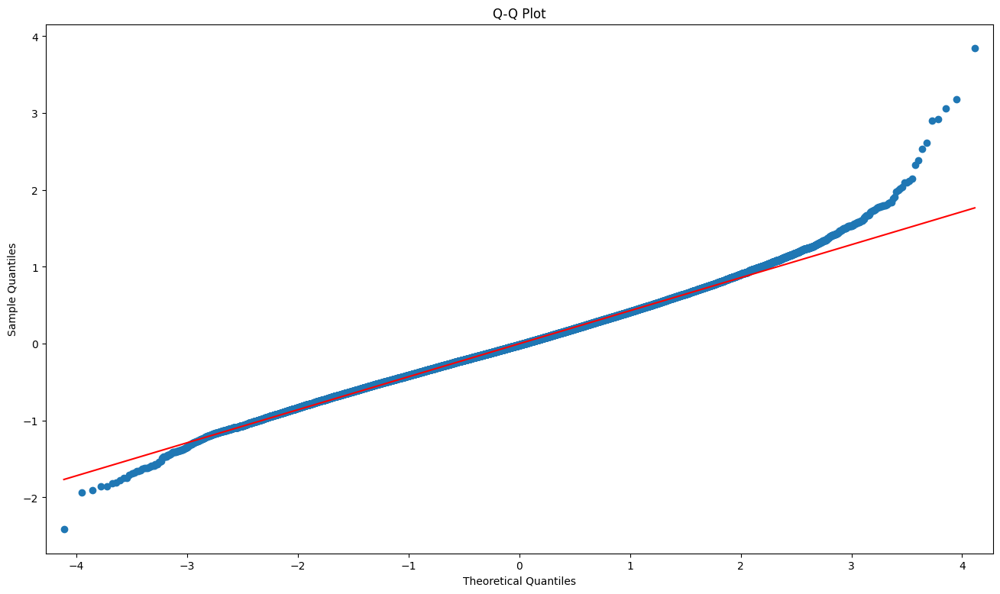

In [111]:
## Q-Q PLot

fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111)

sm.qqplot(result.resid, dist = stats.norm, line = 's', ax = ax)

ax.set_title("Q-Q Plot")

In [112]:
labels = ["Statistic", "p-value"]

norm_res = stats.shapiro(result.resid)

for key, val in dict(zip(labels, norm_res)).items():
    print(key, val)

Statistic 0.9950032234191895
p-value 8.997687665308198e-37


/storage/home/tinbeh/bump_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [63]:
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
from scipy.stats import ks_2samp


In [64]:
def duration(input_str, date_variable):
    # Remove any non-numeric characters from the input string
    if pd.isna(input_str):
        # print('Invalid input format')
        return ''

    input_str = ''.join(filter(str.isdigit, input_str))

    # Convert the input string to integers
    try:
        weeks = 0
        days = 0
        if len(input_str) > 3:
            # print('Invalid input format')
            return ''
        if len(input_str) == 3:
            weeks = int(input_str[:-1])
            days = int(input_str[-1:])
        if len(input_str) == 2:
            weeks = int(input_str)
            days = 0
    except ValueError:
        raise ValueError("Invalid input format")
    # Calculate the total number of days in the duration
    total_days = (weeks * 7) + days
    
    # Create a timedelta object for the duration
    duration = timedelta(days=total_days)

    return duration


df_birth['duration'] = df_birth.apply(lambda x: duration(x['birth_gestage'], x['date']), axis=1)
df_birth['duration'] = pd.to_timedelta(df_birth['duration'])
df_birth['conception'] = df_birth.apply(lambda row: pd.to_datetime(row['birth_date']) - row['duration'], axis=1)

def calculate_gestational_age(df, df_birth):
    conception_dates = df_birth.set_index('record_id')['conception'].to_dict()
    
    def gestational_age(row):
        conception_date = conception_dates.get(row['record_id'])
        if pd.isnull(conception_date):
            return None
        return (row['date'] - conception_date).days

    df['gestationalAge'] = df.apply(gestational_age, axis=1)
    
    return df

conceptionSleep = df_sleep.copy()
record_id_to_conception_date = dict(zip(df_birth.record_id, df_birth.conception))

conceptionSleep['date'] = pd.to_datetime(conceptionSleep['date'])

conceptionSleep = conceptionSleep[conceptionSleep.apply(lambda x: x.date >= record_id_to_conception_date.get(x.record_id, pd.to_datetime('1970-01-01')), axis=1)]

sleepTest = calculate_gestational_age(conceptionSleep, df_birth)

df_temp = sleepTest[['deep', 'record_id', 'gestationalAge']]
df_temp['gestationalWeek'] = np.floor(df_temp['gestationalAge'] / 7)
df_temp['gestationalWeek'] = df_temp['gestationalWeek'].astype('Int64')

mask = df_temp.groupby(['record_id', 'gestationalWeek']).filter(lambda x: len(x) >= 2)
weekly_avg_df = mask.groupby(['record_id', 'gestationalWeek']).agg({'deep': 'mean'}).reset_index()

# Rank ordering of participants

# Generate a reference U-shape curve (mean across all individuals)
def generate_reference_curve(data):
    ref_curve = data.groupby('gestationalWeek')['deep'].mean()
    return ref_curve

def quadratic(x, a, b, c):
    y = a*x**2 + b*x + c
    return y

r2 = []

# Count rejected participants:
lengthR = 0
vertexR = 0

for user in weekly_avg_df.record_id.unique():
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')
    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]




    if len(dfUser) < 15:
        lengthR += 1
        continue
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)

    y_values_raw = np.array(dfUser.deep.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        if (vertex_x < 10 or vertex_x > 40):
            vertexR += 1
            continue

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        r2.append([r2_value, user])
    else:
        lengthR += 1

print('Rejected Length - ' + str(lengthR))
print('Rejected Vertex - ' + str(vertexR))
print('Total Participants - ' + str(len(r2)))

sorted_r2 = sorted(r2, key=lambda x: x[0], reverse=True)
sorted_r2_df = pd.DataFrame(sorted_r2, columns=['r2_value', 'record_id'])

# For Graphing Individual Curves 

# Generate a reference U-shape curve (mean across all individuals)
def generate_reference_curve(data):
    ref_curve = data.groupby('gestationalWeek')['deep'].mean()
    return ref_curve

def quadratic(x, a, b, c):
    y = a*x**2 + b*x + c
    return y

/tmp/ipykernel_2762/2634305341.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['gestationalWeek'] = np.floor(df_temp['gestationalAge'] / 7)
/tmp/ipykernel_2762/2634305341.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['gestationalWeek'] = df_temp['gestationalWeek'].astype('Int64')


Rejected Length - 38
Rejected Vertex - 87
Total Participants - 275


In [67]:
dict_all_name = {
    "preterm": preterm,
    "gestationalDM": gestationalDM,
    "preeclampsia": preeclampsia,
    "gestationalHTN": gestationalHTN,
    "postpartumHemorrhage": postpartumHemorrhage,
    "depression": depression,
    "superHealthy": superHealthy
}

In [68]:
for name, value in dict_all_name.items():
    print(f'{name}: {len(value)}')

preterm: 37
gestationalDM: 42
preeclampsia: 38
gestationalHTN: 66
postpartumHemorrhage: 39
depression: 189
superHealthy: 17


In [69]:
hem_id = df_birth.loc[df_birth.postparhem == 1].record_id.unique()
hyper_id = df_birth.loc[df_birth.hypertension == 1].record_id.unique()

In [70]:
"""
for ids in gestationalHTN:
    if ids in hyper_id:
        print('same', ids)
    else:
        print(ids)
"""

"\nfor ids in gestationalHTN:\n    if ids in hyper_id:\n        print('same', ids)\n    else:\n        print(ids)\n"

In [71]:
all_users = preterm | gestationalDM | preeclampsia | gestationalHTN | postpartumHemorrhage | depression | superHealthy

# Initialize the DataFrame with all user IDs
pregnancy_conditions = pd.DataFrame({'record_id': list(all_users)})

# Define a function to create a column based on membership in a set
def membership_column(user_set, all_users):
    return [1 if user in user_set else 0 for user in all_users]

# Add columns for each set
pregnancy_conditions['preterm'] = membership_column(preterm, pregnancy_conditions['record_id'])
pregnancy_conditions['gestationalDM'] = membership_column(gestationalDM, pregnancy_conditions['record_id'])
pregnancy_conditions['preeclampsia'] = membership_column(preeclampsia, pregnancy_conditions['record_id'])
pregnancy_conditions['gestationalHTN'] = membership_column(gestationalHTN, pregnancy_conditions['record_id'])
pregnancy_conditions['postpartumHemorrhage'] = membership_column(postpartumHemorrhage, pregnancy_conditions['record_id'])
pregnancy_conditions['depression'] = membership_column(depression, pregnancy_conditions['record_id'])
pregnancy_conditions['superHealthy'] = membership_column(superHealthy, pregnancy_conditions['record_id'])


In [72]:
pregnancy_conditions_analysis = pd.merge(df_w_static, pregnancy_conditions, on='record_id', how='inner')
pregnancy_conditions_analysis = pd.merge(pregnancy_conditions_analysis, sorted_r2_df, on='record_id', how='inner')


In [73]:
u = pregnancy_conditions_analysis.loc[pregnancy_conditions_analysis.record_id.isin(super_healthy_id)].r2_value.unique()
len(u)

18

In [87]:
#np.sort(r2_list_healthy)

In [88]:
#sorted_r2_df.loc[sorted_r2_df.record_id.isin(super_healthy_id)].r2_value

In [79]:
data = []
record_ids = weekly_avg_df.record_id.unique()
vertexs = []
feat_name = 'deep'

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser[feat_name].values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        
        data.append({
            'record_id': user,
            'vertex': vertex_x,
            'r2_value': r2_value
        })

# Save the dataframe to a CSV file
df = pd.DataFrame(data)
df.to_csv(f'r2_{feat_name}.csv', index=False)

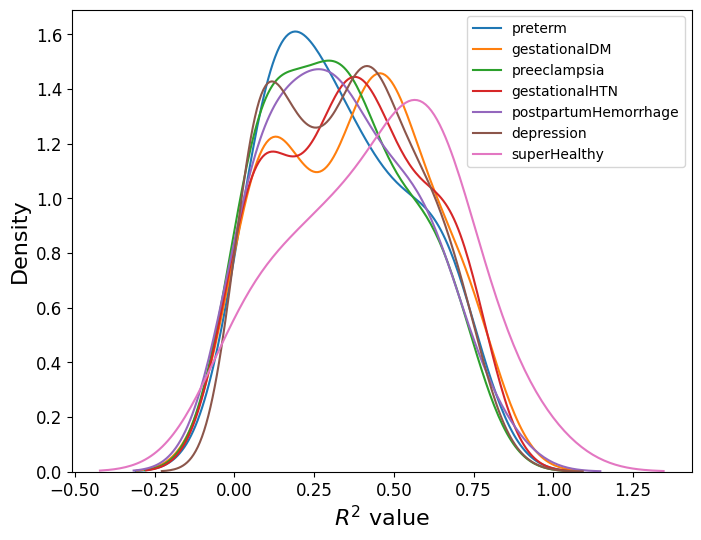

In [80]:
Group_name = ['superHealthy','Very Preterm','Late Preterm', 'Preeclampsia', 'Postpartum Hemorrhage (PPH)', 'others']
all_conditions = {
    "preterm": [],
    "gestationalDM": [],
    "preeclampsia": [],
    "gestationalHTN": [],
    "postpartumHemorrhage": [],
    "depression": [],
    "superHealthy": []
}
opposite_all_conditions = {
    "preterm": [],
    "gestationalDM": [],
    "preeclampsia": [],
    "gestationalHTN": [],
    "postpartumHemorrhage": [],
    "depression": [],
    "superHealthy": []
}
all_r2 = []
r2_list_other = []
#super_healthy_id
v_pre_id = static_feat2.loc[(static_feat2.gestage_week>=28) & (static_feat2.gestage_week<32)].record_id.unique() #very preterm
l_pre_id = static_feat2.loc[(static_feat2.gestage_week>=32) & (static_feat2.gestage_week<=37)].record_id.unique() #late preterm
hyper_id = df_birth.loc[df_birth.hypertension == 1].record_id.unique()
hem_id = df_birth.loc[df_birth.postparhem == 1].record_id.unique()

record_ids = weekly_avg_df.record_id.unique()
vertexs = []

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.deep.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    flag_others = True
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        
        vertexs.append(vertex_x)
        all_r2.append(r2_value)
        for condition in all_conditions.keys():
            if user in dict_all_name[condition]:
                all_conditions[condition].append(r2_value)
                if condition != "superHealthy":
                    flag_others=False
            else:
                opposite_all_conditions[condition].append(r2_value)
        if flag_others:
            r2_list_other.append(r2_value)
            
plt.figure(figsize=(8, 6), dpi=100)
p_value_all = []
# Loop over each condition and plot the KDE for the r2_value where the condition is 1
for condition in all_conditions:
    positive_condition = all_conditions[condition]
    negative_condition = opposite_all_conditions[condition] 

    #negative_condition = r2_list_other 
    sns.kdeplot(positive_condition, fill=False, label=condition)
    # Perform independent two-sample t-test
    #t_stat, p_value = stats.ttest_ind(positive_condition["r2_value"], negative_condition["r2_value"])
    ks_statistic, p_value = ks_2samp(positive_condition, negative_condition)

    p_value_all.append(p_value)
# plt.title('Kernel Density Plot for r2_value across Conditions')
plt.xlabel('$R^2$ value', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend()
plt.show()

In [112]:
p_value_all

[0.48216612942598175,
 0.8646237043232853,
 0.3637983820732056,
 0.9526555351930444,
 0.7028871163087783,
 0.7807540022154442,
 0.0702300651262935]

Text(0, 0.5, 'p value')

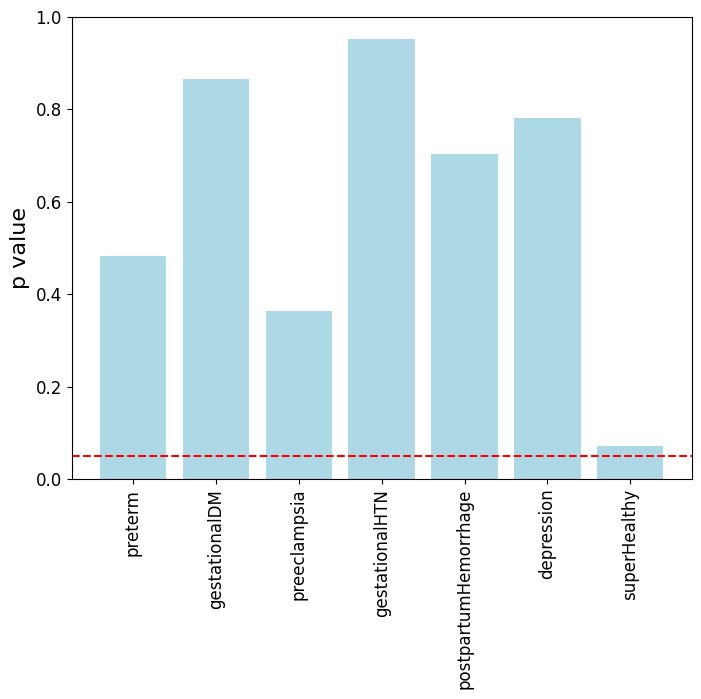

In [68]:
# Plotting the vertical bar graph
plt.figure(figsize=(8, 6), dpi=100)
plt.bar(all_conditions.keys(), p_value_all, color='lightblue')

plt.ylim([0, 1])
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
# plt.xlabel('conditions')
plt.axhline(0.05, color='red', linestyle='--')
plt.ylabel('p value', fontsize=16)
plt.ylabel('p value')

In [1]:
vertexs = []
record_ids = ['sema4_779', 'sema4_512', 'sema4_339' , 'direct_281', 'sema4_831']
record_ids = weekly_avg_df.record_id.unique()

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.deep.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)
        if ((r2_value>=0.8)):# or (r2_value<0.1)):
            vertexs.append(vertex_x)
            # Graph the data along with the vertex
            fig = go.Figure()
            fig.add_trace(go.Scatter(x=x_values, y=y_values_raw, mode='markers', name='Raw Data'))
            fig.add_trace(go.Scatter(x=x_values, y=y_fitted, mode='lines', name='Quadratic Fit'))
            fig.add_trace(go.Scatter(x=[vertex_x], y=[vertex_y], mode='markers', marker=dict(color='red', size=10), name='Vertex'))

            # fig.update_xaxes(range=[-150, 0])
            fig.update_xaxes(range=[10, 40])
            fig.update_layout(title='Quadratic fit with Vertex on Weekly Data - ' + f'{user}, R2 Score={r2_value:.2f}', xaxis_title='Gestational Week', yaxis_title='Deep', legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
            #plt.show(fig)
            fig.show()
print(np.mean(vertexs))

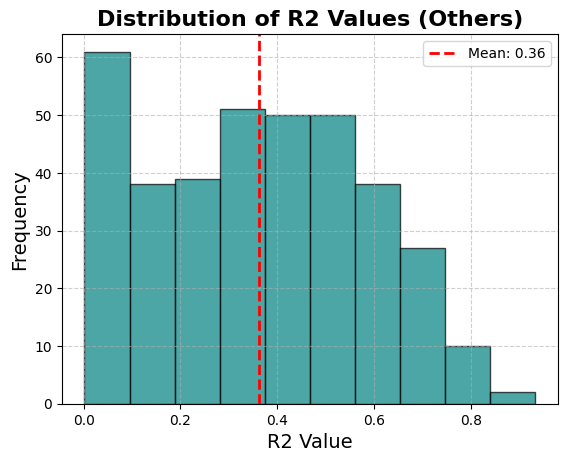

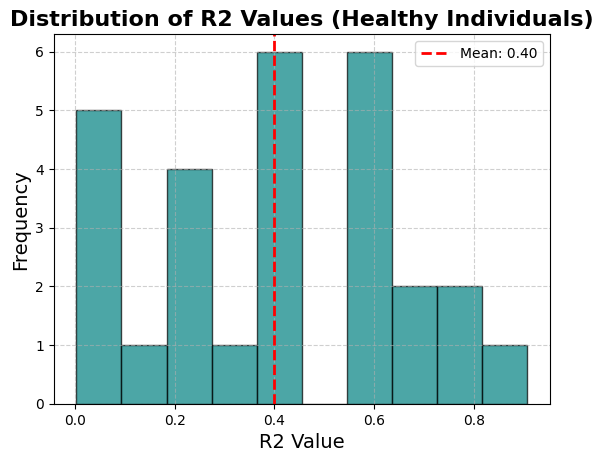

KS Statistic: 0.1715456674473068
P-value: 0.3822080966354342
No significant difference between the distributions (p >= 0.05).


In [75]:
record_ids = weekly_avg_df.record_id.unique()
vertexs = []
r2_list_other = []
r2_list_healthy = []

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.deep.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]

    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        vertexs.append(vertex_x)
        if user in super_healthy_id:
            r2_list_healthy.append(r2_value)
        else:
            r2_list_other.append(r2_value)
            
fig, ax = plt.subplots()

ax.hist(r2_list_other, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_other)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Others)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()

fig, ax = plt.subplots()

ax.hist(r2_list_healthy, bins=10, color='teal', edgecolor='black', alpha=0.7)
mean_value = np.mean(r2_list_healthy)
ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
ax.set_title('Distribution of R2 Values (Healthy Individuals)', fontsize=16, fontweight='bold')
ax.set_xlabel('R2 Value', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()
plt.show()


# Perform the Kolmogorov-Smirnov test
ks_statistic, p_value = ks_2samp(r2_list_other, r2_list_healthy)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("The distributions are statistically different (p < 0.05).")
else:
    print("No significant difference between the distributions (p >= 0.05).")

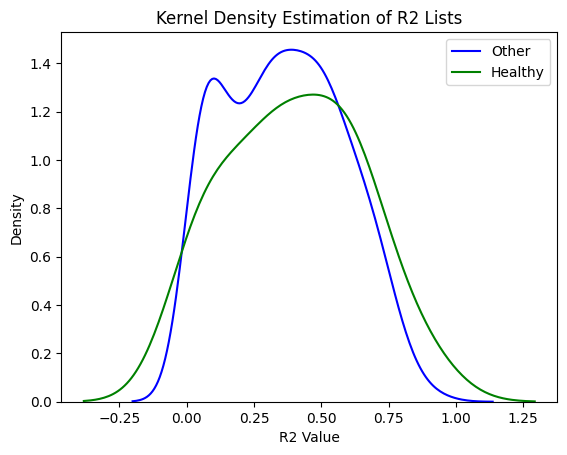

In [97]:
sns.kdeplot(r2_list_other, label='Other', color='blue')
sns.kdeplot(r2_list_healthy, label='Healthy', color='green')
plt.title('Kernel Density Estimation of R2 Lists')
plt.xlabel('R2 Value')
plt.ylabel('Density')

# Show legend
plt.legend()

# Show the plot
plt.show()

super healthy length: 28


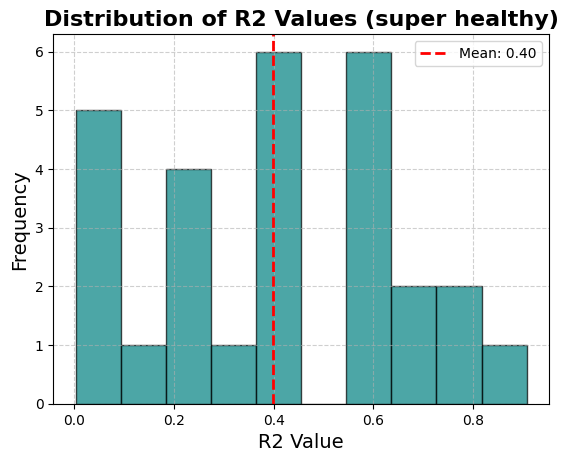

KS Statistic: 0.165406162464986
P-value: 0.44291700946627244
No significant difference between the distributions (p >= 0.05).
Very Preterm length: 4


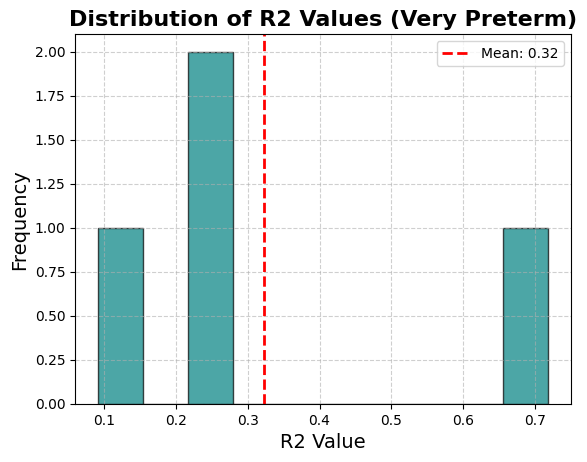

KS Statistic: 0.40490196078431373
P-value: 0.4311640010827302
No significant difference between the distributions (p >= 0.05).
Late Preterm length: 76


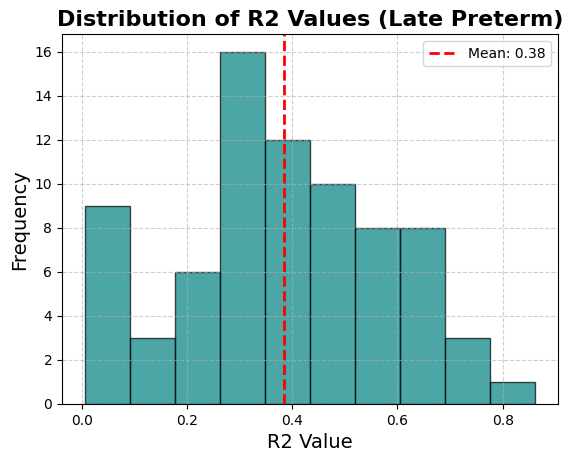

KS Statistic: 0.13962848297213623
P-value: 0.18247561809375346
No significant difference between the distributions (p >= 0.05).
Preeclampsia length: 43


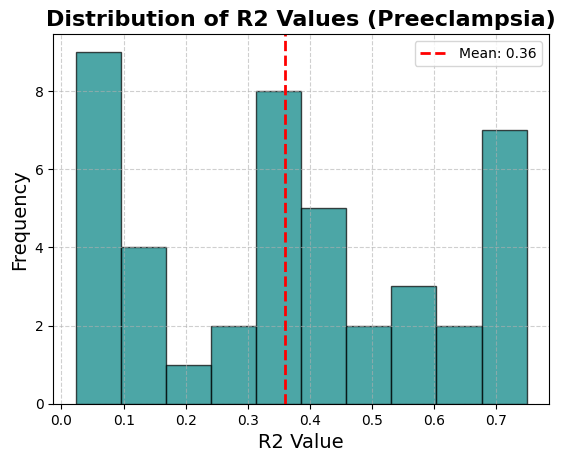

KS Statistic: 0.08691290469676242
P-value: 0.9179953060040097
No significant difference between the distributions (p >= 0.05).
Postpartum Hemorrhage (PPH) length: 37


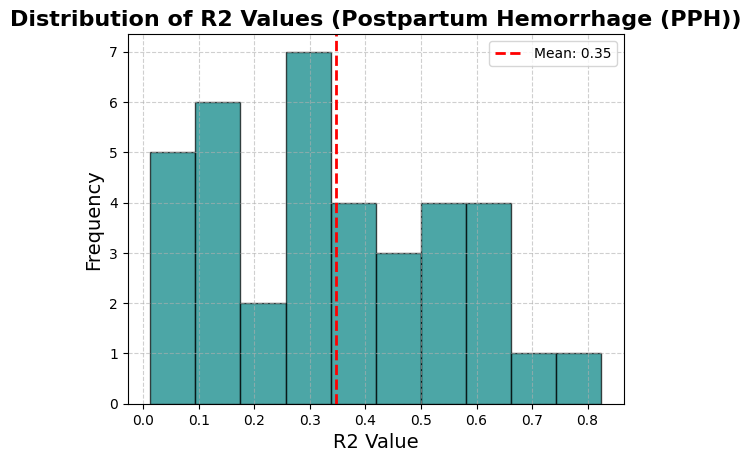

KS Statistic: 0.09570747217806042
P-value: 0.8970659175868506
No significant difference between the distributions (p >= 0.05).
others length: 255


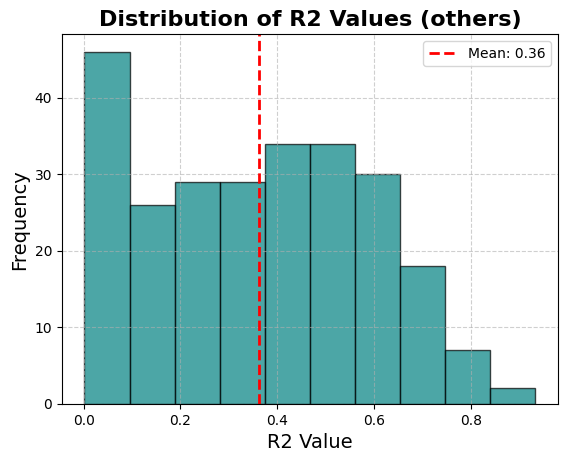

KS Statistic: 0.0
P-value: 1.0
No significant difference between the distributions (p >= 0.05).


In [98]:
Group_name = ['super healthy','Very Preterm','Late Preterm', 'Preeclampsia', 'Postpartum Hemorrhage (PPH)', 'others']
#super_healthy_id
v_pre_id = static_feat2.loc[(static_feat2.gestage_week>=28) & (static_feat2.gestage_week<32)].record_id.unique() #very preterm
l_pre_id = static_feat2.loc[(static_feat2.gestage_week>=32) & (static_feat2.gestage_week<=37)].record_id.unique() #late preterm
hyper_id = df_birth.loc[df_birth.hypertension == 1].record_id.unique()
hem_id = df_birth.loc[df_birth.postparhem == 1].record_id.unique()

record_ids = weekly_avg_df.record_id.unique()
vertexs = []
r2_list_other = []
r2_list_healthy = []
r2_list_v_pre, r2_list_l_pre, r2_list_hyper, r2_list_hem = [],[],[],[]

for user in record_ids:
    dfUser = weekly_avg_df[(weekly_avg_df['record_id'] == user)]
    dfUser = dfUser.sort_values('gestationalWeek')

    dfUser = dfUser[dfUser['gestationalWeek'] <= 40]
    dfUser = dfUser[dfUser['gestationalWeek'] >= 10]
    x_values = np.array(dfUser.gestationalWeek.values, dtype=float)
    y_values_raw = np.array(dfUser.deep.values, dtype=float)

    mask = ~np.isnan(y_values_raw) & ~np.isinf(y_values_raw)
    x_values = x_values[mask]
    y_values_raw = y_values_raw[mask]
    flag_others = True
    if len(x_values) > 2 and len(y_values_raw) > 2:
        # Fit a quadratic function to the data
        params, _ = curve_fit(quadratic, x_values, y_values_raw)

        # Extract parameters
        a, b, c = params
        vertex_x = -b/(2*a)
        vertex_y = quadratic(vertex_x, a, b, c)

        y_fitted = quadratic(x_values, *params)

        r2_value = r2_score(y_values_raw, y_fitted)

        vertexs.append(vertex_x)
        if user in super_healthy_id:
            r2_list_healthy.append(r2_value)
        if user in v_pre_id:
            r2_list_v_pre.append(r2_value); flag_others=False
        if user in l_pre_id:
            r2_list_l_pre.append(r2_value); flag_others=False
        if user in hyper_id:
            r2_list_hyper.append(r2_value); flag_others=False
        if user in hem_id:
            r2_list_hem.append(r2_value); flag_others=False
        if flag_others:
            r2_list_other.append(r2_value)
            
list_all = []
list_all.append(r2_list_healthy); list_all.append(r2_list_v_pre); list_all.append(r2_list_l_pre)
list_all.append(r2_list_hyper); list_all.append(r2_list_hem); list_all.append(r2_list_other)
for i in range(len(Group_name)):
    print(f'{Group_name[i]} length: {len(list_all[i])}')
    
    if len(list_all[i])==0:
        continue

    fig, ax = plt.subplots()

    ax.hist(list_all[i], bins=10, color='teal', edgecolor='black', alpha=0.7)
    mean_value = np.mean(list_all[i])
    ax.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
    ax.set_title(f'Distribution of R2 Values ({Group_name[i]})', fontsize=16, fontweight='bold')
    ax.set_xlabel('R2 Value', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend()
    plt.show()

    # Perform the Kolmogorov-Smirnov test
    ks_statistic, p_value = ks_2samp(r2_list_other, list_all[i])

    print(f"KS Statistic: {ks_statistic}")
    print(f"P-value: {p_value}")

    if p_value < 0.05:
        print("The distributions are statistically different (p < 0.05).")
    else:
        print("No significant difference between the distributions (p >= 0.05).")

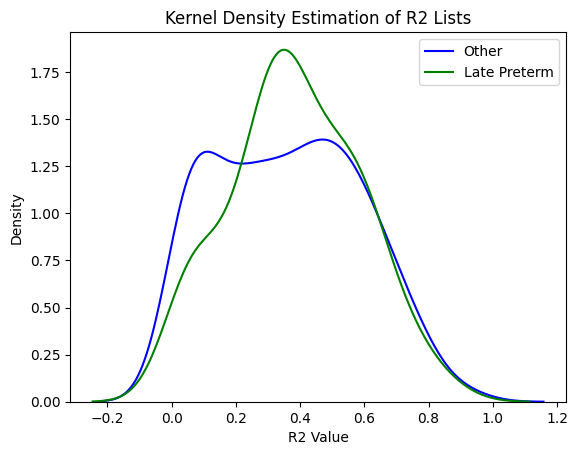

In [99]:
sns.kdeplot(r2_list_other, label='Other', color='blue')
sns.kdeplot(r2_list_l_pre, label='Late Preterm', color='green')
plt.title('Kernel Density Estimation of R2 Lists')
plt.xlabel('R2 Value')
plt.ylabel('Density')

# Show legend
plt.legend()

# Show the plot
plt.show()

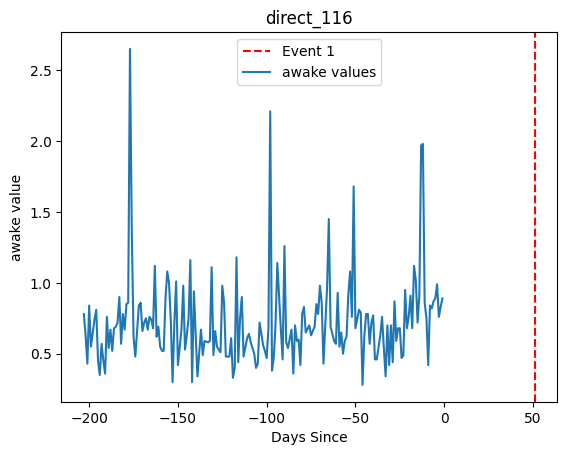

In [58]:
index = 1 
record_ids = ['sema4_68','sema4_124']
dates = ['2021-09-08','2022-10-27']
name = 'awake'
if record_ids[index] not in df_w_static.record_id.unique():
    print(record_ids[index])
user_df = df_w_static.loc[df_w_static.record_id == record_ids[index]]
user_df = user_df.sort_values(by='daysSince')

birth_date = df_birth.loc[df_birth['record_id'] == record_ids[index], 'birth_date'].values[0]
date1 = pd.to_datetime(dates[index])
# Calculate the differences
plt.figure()

diff_days = (date1 - birth_date).days

plt.axvline(diff_days, color='r', linestyle='--', label=f'Event {j+1}')  # Dashed line at diff_days

plt.plot(user_df.daysSince, user_df[name], label=f'{name} values')

# Add labels and title
plt.xlabel('Days Since')
plt.ylabel(f'{name} value')
plt.title(f'{ids}')
plt.legend()

In [118]:
user_df = df_w_static.loc[df_w_static.record_id == 'sema4_1077']

In [124]:
df_birth['birth_date'] = pd.to_datetime(df_birth['birth_date'])
birth_date = df_birth.loc[df_birth['record_id'] == 'sema4_1077', 'birth_date'].values[0]
date1 = pd.to_datetime('11/25/2022')
date2 = pd.to_datetime('11/29/2022')

# Calculate the differences
diff_date1 = (birth_date - date1).days
diff_date2 = (birth_date - date2).days
diff_date1, diff_date2

(131, 127)

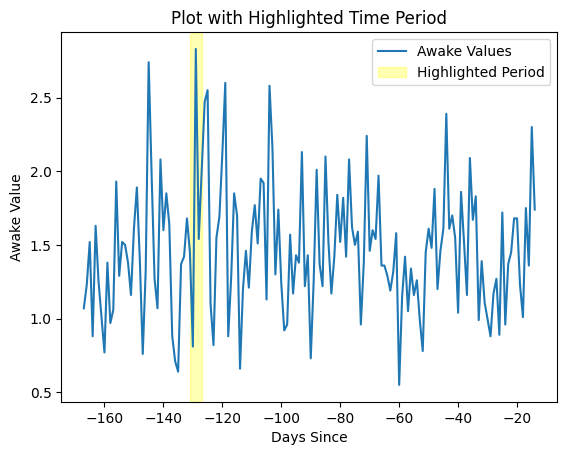

In [127]:
plt.figure()
plt.plot(user_df.daysSince, user_df.awake, label='Awake Values')

# Highlight the time period between the two dates
plt.axvspan(-diff_date1, -diff_date2, color='yellow', alpha=0.3, label='Highlighted Period')

# Add labels and title
plt.xlabel('Days Since')
plt.ylabel('Awake Value')
plt.title('Plot with Highlighted Time Period')
plt.legend()

In [50]:
key = 'bump/app_activities/surveys.csv.gz'
df_survey = pd.read_csv(file_loc+key, compression='gzip')

/tmp/ipykernel_1217/3505122148.py:2: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df_survey = pd.read_csv(file_loc+key, compression='gzip')


In [51]:
part_survey = df_survey[df_survey['question_id']==181]
print(part_survey.answer_text.unique())
df_events = part_survey[part_survey.answer_text == 'Only temporarily laid off, sick leave or maternity leave']

['Other' 'Student' 'Keeping house' 'Disabled, permanently or temporarily'
 'Looking for work, unemployed'
 'Only temporarily laid off, sick leave or maternity leave' 'Working now']


sema4_1034
2021-11-16T00:00:00.000000000 2021-11-11 00:00:00 2024-02-22 08:00:00 -5 0
sema4_217
2021-11-28T00:00:00.000000000 2021-11-11 00:00:00 2024-02-22 08:00:00 -17 0
2023-03-28T00:00:00.000000000 2022-10-07 00:00:00 2025-01-17 07:00:00 -172 0
2023-03-30T00:00:00.000000000 2022-10-10 00:00:00 2025-01-20 07:00:00 -171 0
2023-03-16T00:00:00.000000000 2022-10-10 18:00:00 2025-01-21 01:00:00 -157 0


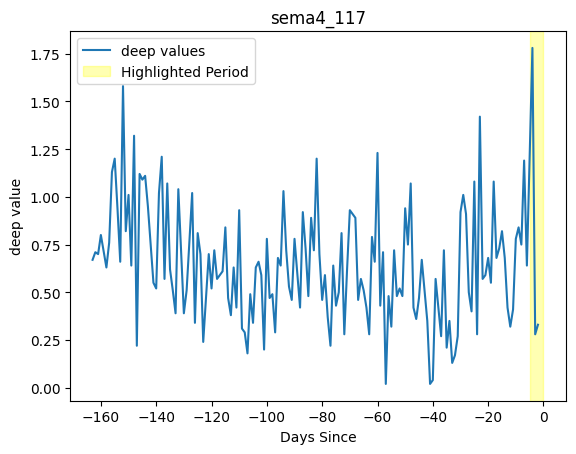

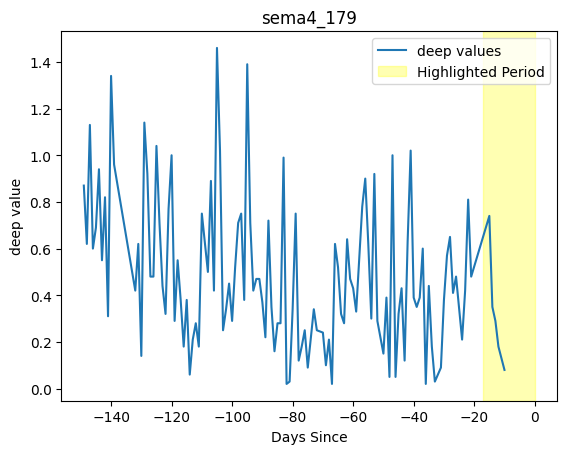

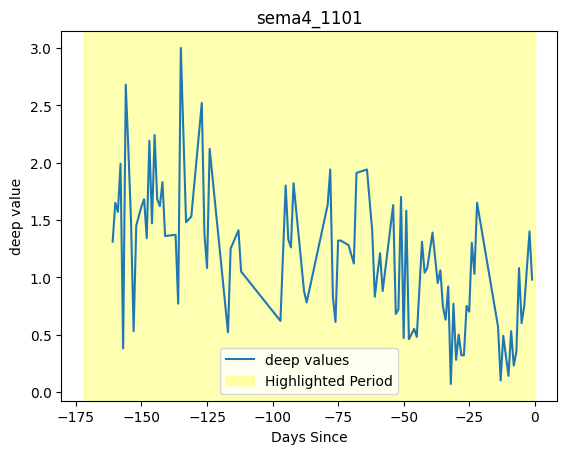

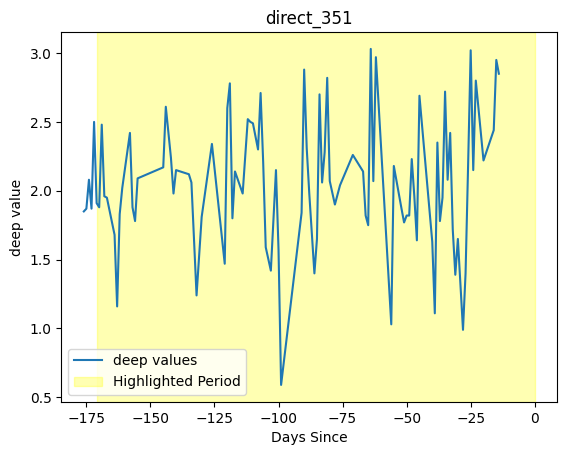

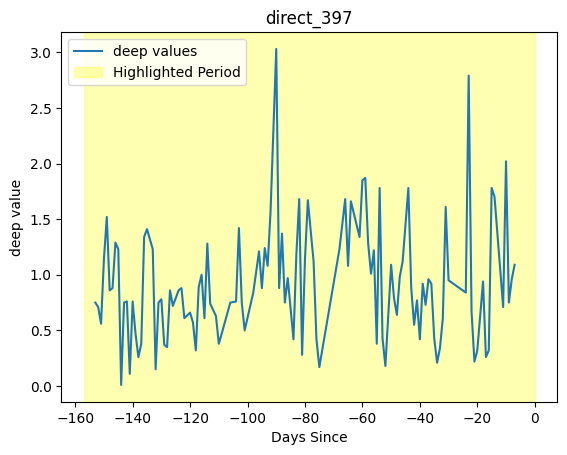

In [52]:
df_birth['birth_date'] = pd.to_datetime(df_birth['birth_date'])
name = 'deep'
for ids in df_events.record_id:
    if ids not in df_w_static.record_id.unique():
        print(ids)
        continue
    u = df_events.loc[df_events.record_id==ids]
    user_df = df_w_static.loc[df_w_static.record_id == ids]
    user_df = user_df.sort_values(by='daysSince')

    birth_date = df_birth.loc[df_birth['record_id'] == ids, 'birth_date'].values[0]
    date1 = pd.to_datetime(u['from'].iloc[0])
    date2 = pd.to_datetime(u['to'].iloc[0])

    # Calculate the differences
    diff_date1 = (date1 - birth_date).days
    diff_date2 = (date2 - birth_date).days
    if diff_date1>0:
        continue
    diff_date2 = min(diff_date2,0)
    print(birth_date, date1, date2, diff_date1, diff_date2)
    plt.figure()
    plt.plot(user_df.daysSince, user_df[name], label=f'{name} values')

    # Highlight the time period between the two dates
    plt.axvspan(diff_date1, diff_date2, color='yellow', alpha=0.3, label='Highlighted Period')

    # Add labels and title
    plt.xlabel('Days Since')
    plt.ylabel(f'{name} value')
    plt.title(f'{ids}')
    plt.legend()

In [53]:
part_survey = df_survey[df_survey['question_id']==90]
print(part_survey.answer_text.unique())
df_events = part_survey[part_survey.answer_text == 'Very much']

['Not at all' 'A little bit' 'Somewhat' 'Quite a bit' 'Very much']


sema4_519
sema4_510
sema4_421
sema4_1096
direct_456
direct_144


/tmp/ipykernel_1217/3076724815.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


sema4_83
sema4_71
sema4_68
sema4_183
sema4_168
sema4_56
sema4_50
sema4_489
sema4_506
sema4_366
direct_114


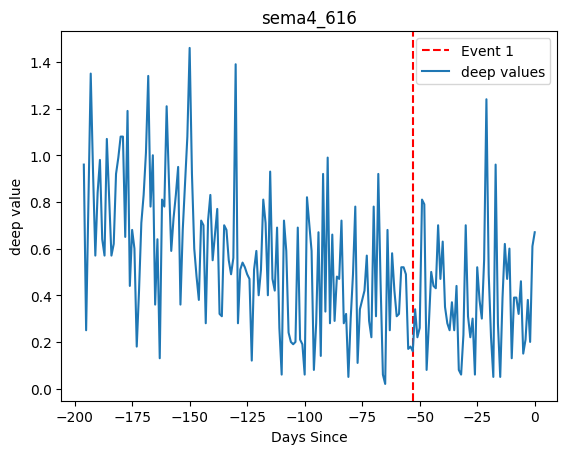

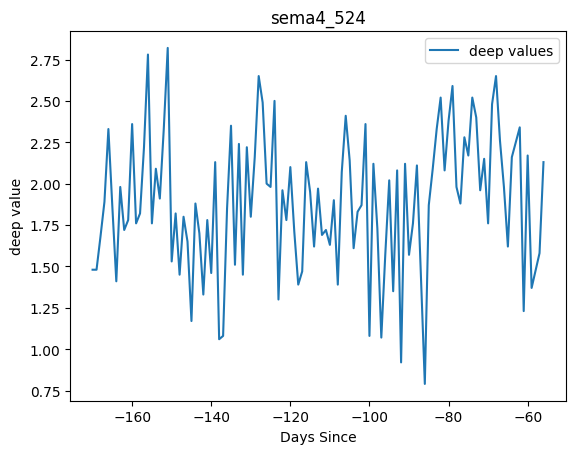

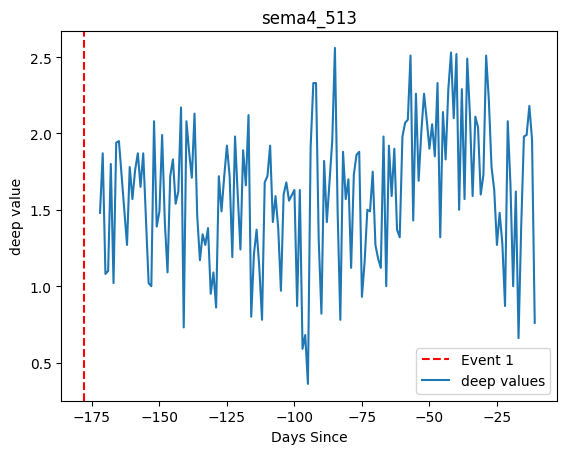

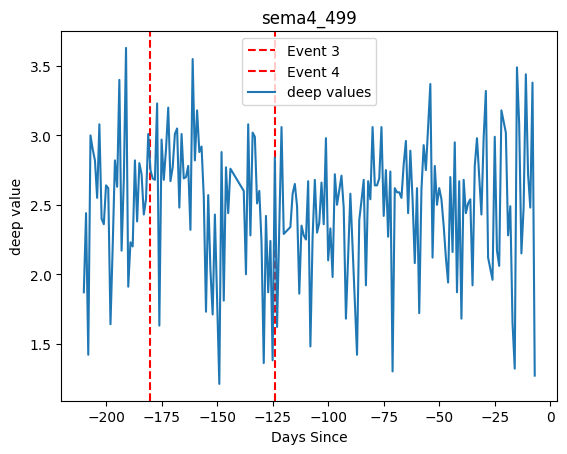

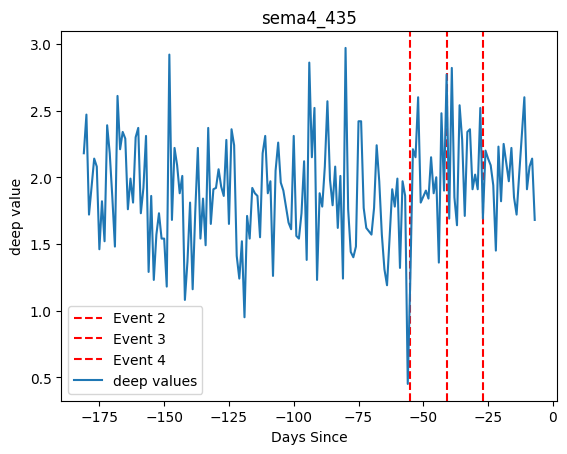

...

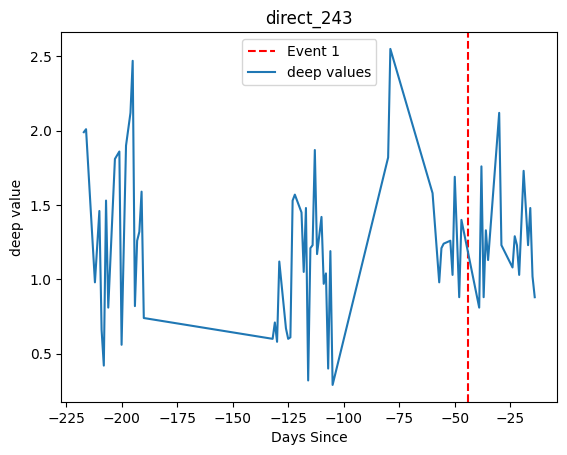

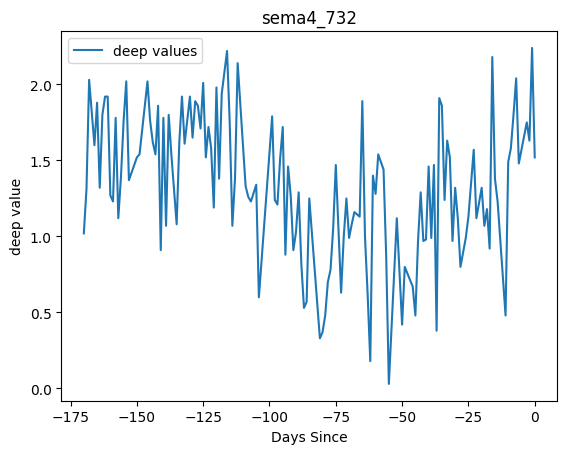

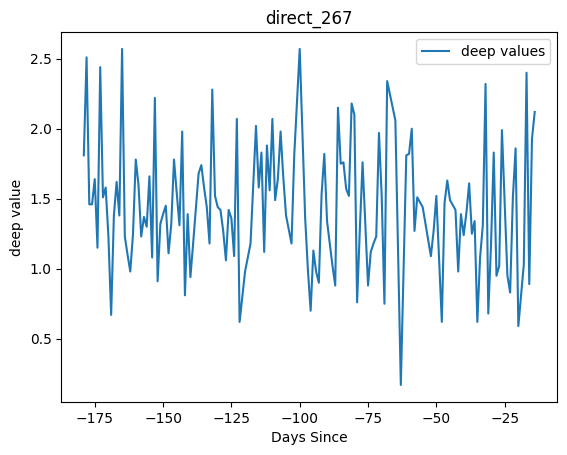

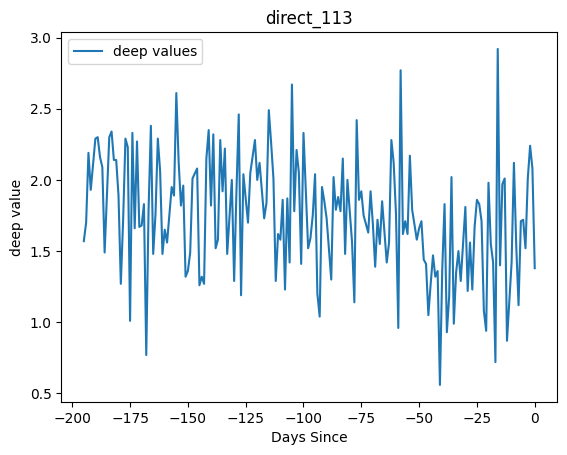

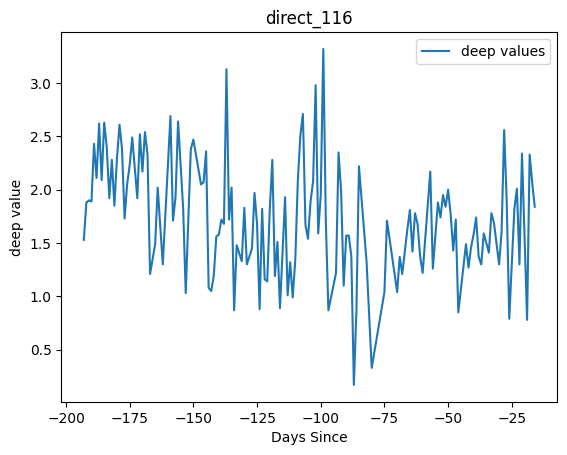

In [54]:
df_birth['birth_date'] = pd.to_datetime(df_birth['birth_date'])
name = 'deep'
for ids in df_events.record_id.unique():
    if ids not in df_w_static.record_id.unique():
        print(ids)
        continue
    u = df_events.loc[df_events.record_id==ids]
    user_df = df_w_static.loc[df_w_static.record_id == ids]
    user_df = user_df.sort_values(by='daysSince')
    birth_date = df_birth.loc[df_birth['record_id'] == ids, 'birth_date'].values[0]
    
    plt.figure()
    for j in range(len(u)):
        date1 = pd.to_datetime(u['event_date'].iloc[j])
        diff_days = (date1 - birth_date).days
        if diff_days>0:
            continue

        plt.axvline(diff_days, color='r', linestyle='--', label=f'Event {j+1}')  # Dashed line at diff_days

    plt.plot(user_df.daysSince, user_df[name], label=f'{name} values')

    # Add labels and title
    plt.xlabel('Days Since')
    plt.ylabel(f'{name} value')
    plt.title(f'{ids}')
    plt.legend()

sema4_519
sema4_510
sema4_421
sema4_1096
direct_456
direct_144


/tmp/ipykernel_1217/643586375.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


sema4_83
sema4_71
sema4_68
sema4_183
sema4_168
sema4_56
sema4_50
sema4_489
sema4_506
sema4_366
direct_114


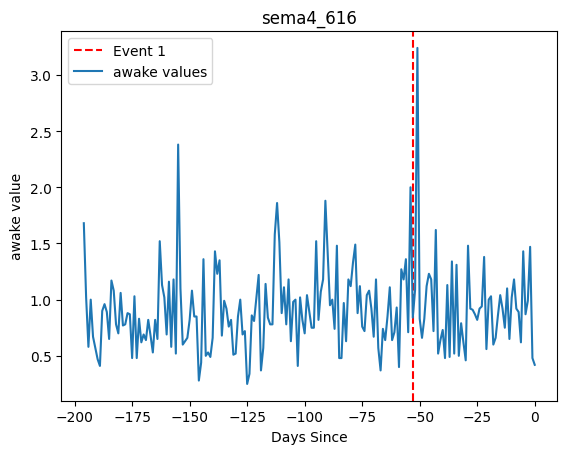

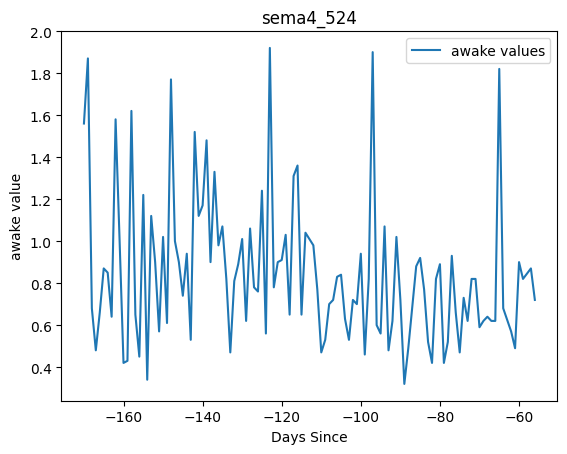

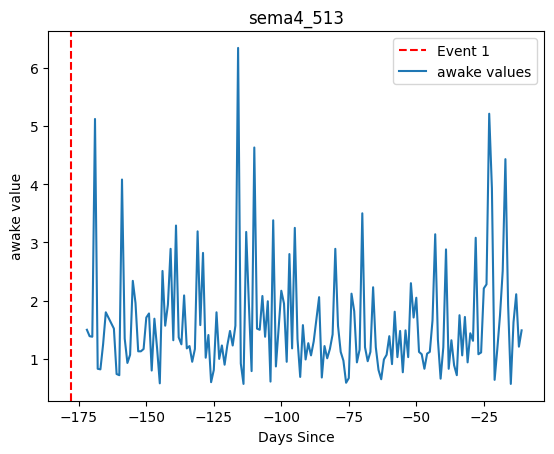

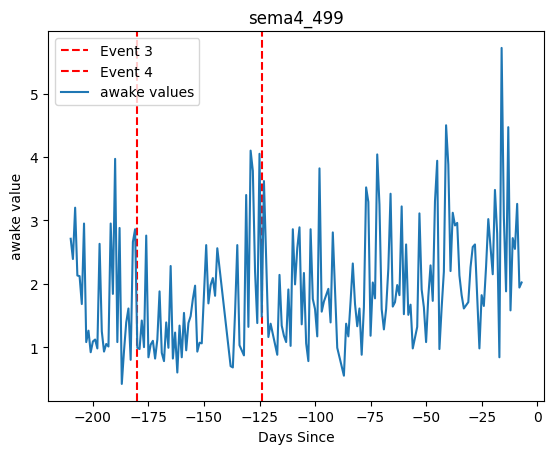

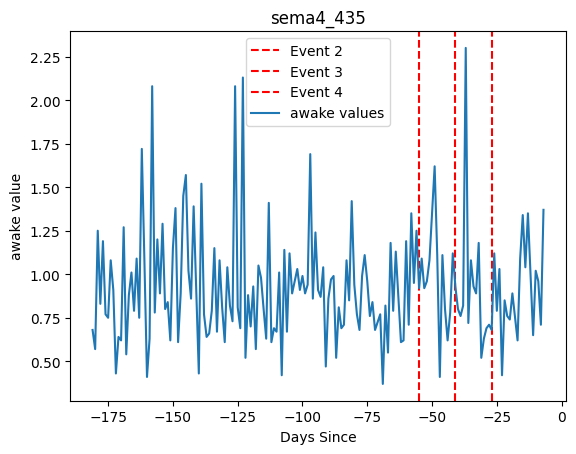

...

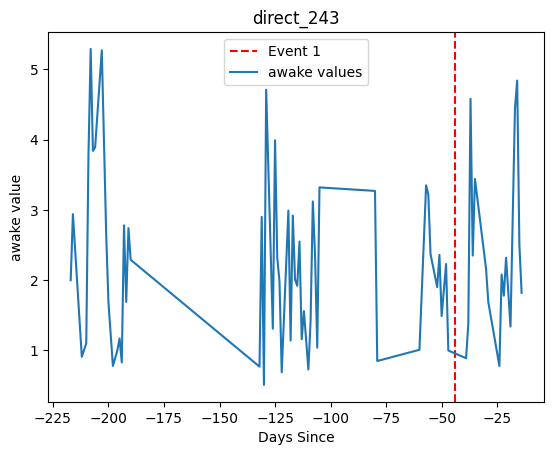

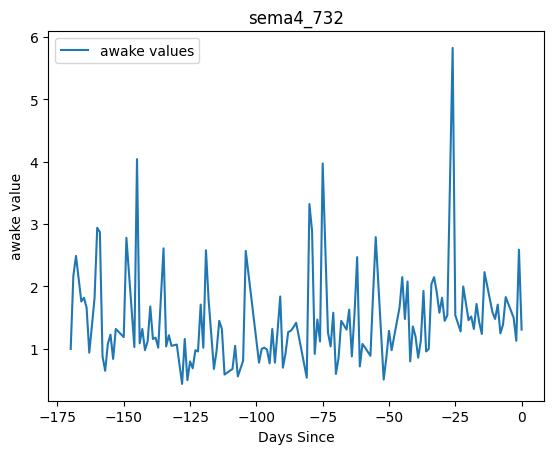

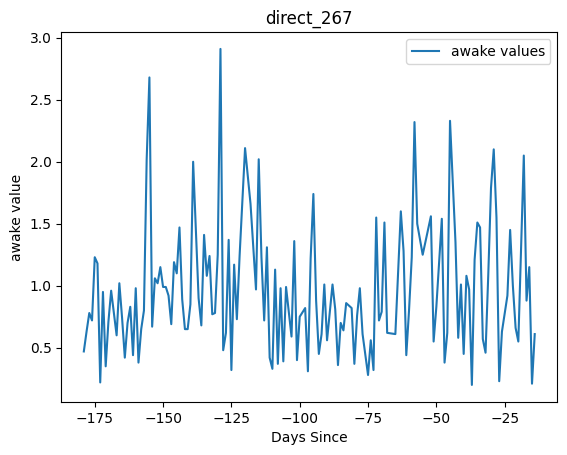

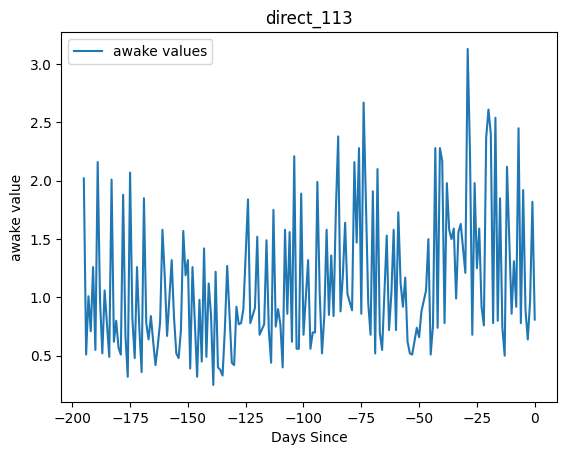

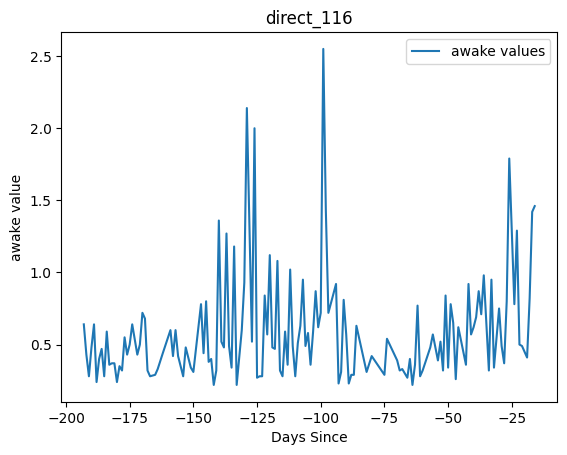

In [55]:
df_birth['birth_date'] = pd.to_datetime(df_birth['birth_date'])
name = 'awake'
for ids in df_events.record_id.unique():
    if ids not in df_w_static.record_id.unique():
        print(ids)
        continue
    u = df_events.loc[df_events.record_id==ids]
    user_df = df_w_static.loc[df_w_static.record_id == ids]
    user_df = user_df.sort_values(by='daysSince')

    birth_date = df_birth.loc[df_birth['record_id'] == ids, 'birth_date'].values[0]
    
    plt.figure()
    for j in range(len(u)):
        date1 = pd.to_datetime(u['event_date'].iloc[j])
        diff_days = (date1 - birth_date).days
        if diff_days>0:
            continue

        plt.axvline(diff_days, color='r', linestyle='--', label=f'Event {j+1}')  # Dashed line at diff_days

    plt.plot(user_df.daysSince, user_df[name], label=f'{name} values')

    # Add labels and title
    plt.xlabel('Days Since')
    plt.ylabel(f'{name} value')
    plt.title(f'{ids}')
    plt.legend()